<a href="https://colab.research.google.com/github/gourabdey96/Learning-from-Failure-or-and-when-surprised/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROJECT - CSE525



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd '/content/gdrive/My Drive/Project_CSE525'

/content/gdrive/My Drive/Project_CSE525


In [ ]:
!pip install gymnasium[classic-control]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 925.5/925.5 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 45.1 MB/s eta 0:00:00
  Attempting uninstall: pygame
    Found existing installation: pygame 2.3.0
    Uninstalling pygame-2.3.0:
      Successfully uninstalled pygame-2.3.0


In [ ]:
!pip install gymnasium[box2d]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 28.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for box2d-py
  Running setup.py clean for box2d-py
Failed to build box2d-py
  Running setup.py install for box2d-py ... done
  DEPRECATION: box2d-py was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. pip 23.1 will enforce this behaviour change. A possible replacement is to fix the wheel build issue reported above. Discussion can be found at https://github.com/pypa/pip/issues/8368


In [ ]:
!pip install gymnasium-robotics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached gymnasium_robotics-1.2.0-py3-none-any.whl (27.9 MB)
  Using cached mujoco-2.3.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.3 MB)
ERROR: Operation cancelled by user


In [ ]:
import imageio
from IPython.display import Image, display
from io import BytesIO

# Code for visualizing the episode

class GIFMaker:
    def __init__(self):
        self.reset()

    def reset(self):
        self.images = []
        self.buffer = BytesIO()

    def append(self, img):
        self.images.append(img)

    def display(self):
        imageio.mimsave(self.buffer, self.images, format='gif')
        gif = Image(data=self.buffer.getvalue())
        display(gif)
        return gif

    def __len__(self):
      return len(self.images)

In [ ]:
import gymnasium as gym
# import gymnasium_robotics as gym_r
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random


In [ ]:
#Replay buffer to hold samples generated from a behaviour policy
class ReplayBuffer():
      def __init__(self, capacity):
          self.capacity = capacity
          self.buffer = deque([], maxlen=self.capacity)

      def push(self, state, action, reward, next_state, done):
          # print((state, action, reward, next_state, done))
          self.buffer.append((state, action, reward, next_state, done))

      def sample(self, batch_size):
          batch = random.sample(self.buffer, batch_size)            #sampling a random batch of size as specified from the buffer
          states = []
          actions = []
          rewards = []
          next_states = []
          dones = []

          for i in range(len(batch)):                                #Separating out each tuple from the random batch generated so that I can directly feed the states to a neural network as a matrix
              states.append(batch[i][0])
              actions.append(batch[i][1])
              rewards.append(batch[i][2])
              next_states.append(batch[i][3])
              dones.append(batch[i][4])

          states = np.stack(states)
          actions = np.stack(actions)
          rewards = np.stack(rewards)
          next_states = np.stack(next_states)
          dones = np.stack(dones)
          return states, actions, rewards, next_states, dones

      def __len__(self):
          return len(self.buffer)


In [ ]:
# import numpy as np


# class HindsightExperienceReplayMemory(object):
#     """
#     Hindsight Experience replay - Takes size, input dimensions and number of actions as parameters
#     """
#     def __init__(self, memory_size, input_dims, n_actions):
#         super(HindsightExperienceReplayMemory, self).__init__()
#         self.max_mem_size = memory_size
#         self.counter = 0

#         # initializes the state, next_state, action, reward, and terminal experience memory
#         self.state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
#         self.next_state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
#         self.reward_memory = np.zeros(memory_size, dtype=np.float32)
#         self.action_memory = np.zeros(memory_size, dtype=np.int64)
#         self.terminal_memory = np.zeros(memory_size, dtype=bool)
#         self.goal_memory = np.zeros((memory_size, input_dims), dtype=np.float32)

#     def add_experience(self, state, action, reward, next_state, done, goal):
#         """
#         Adds new experience to the memory
#         """
#         curr_index = self.counter % self.max_mem_size

#         self.state_memory[curr_index] = state
#         self.action_memory[curr_index] = action
#         self.reward_memory[curr_index] = reward
#         self.next_state_memory[curr_index] = next_state
#         self.terminal_memory[curr_index] = done
#         self.goal_memory[curr_index] = goal

#         self.counter += 1

#     def get_random_experience(self, batch_size):
#         """
#         Returns any random memory from the experience replay memory
#         """
#         rand_index = np.random.choice(min(self.counter, self.max_mem_size), batch_size, replace=False)

#         rand_state = self.state_memory[rand_index]
#         rand_action = self.action_memory[rand_index]
#         rand_reward = self.reward_memory[rand_index]
#         rand_next_state = self.next_state_memory[rand_index]
#         rand_done = self.terminal_memory[rand_index]
#         rand_goal = self.goal_memory[rand_index]

#         return rand_state, rand_action, rand_reward, rand_next_state, rand_done, rand_goal

In [ ]:
#Replay buffer to hold samples generated from a behaviour policy
class HindsightExperienceReplayMemory():
      def __init__(self, capacity):
          self.capacity = capacity
          self.buffer = deque([], maxlen=self.capacity)

      def add_experience(self, state, action, reward, next_state, done, goal):
          # print((state, action, reward, next_state, done))
          self.buffer.append((state, action, reward, next_state, done, goal))

      def get_random_experience(self, batch_size):
          batch = random.sample(self.buffer, batch_size)            #sampling a random batch of size as specified from the buffer
          states = []
          actions = []
          rewards = []
          next_states = []
          dones = []
          goals = []

          for i in range(len(batch)):                                #Separating out each tuple from the random batch generated so that I can directly feed the states to a neural network as a matrix
              states.append(batch[i][0])
              actions.append(batch[i][1])
              rewards.append(batch[i][2])
              next_states.append(batch[i][3])
              dones.append(batch[i][4])
              goals.append(batch[i][5])

          states = np.stack(states)
          actions = np.stack(actions)
          rewards = np.stack(rewards)
          next_states = np.stack(next_states)
          dones = np.stack(dones)
          goals = np.stack(goals)
          return states, actions, rewards, next_states, dones, goals

      def __len__(self):
          return len(self.buffer)


In [ ]:
#Replay buffer to hold samples generated from a behaviour policy
class HindsightExperienceReplayWithPERMemory():
      def __init__(self, memory_size, input_dims, n_actions, goal_space, alpha = 0.6, beta = 0.4, initial_priority = 0.01, min_priority = 0.01):
          self.max_mem_size = memory_size
          self.counter = 0

          # initializes the state, next_state, action, reward, and terminal experience memory
          self.state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.next_state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.reward_memory = np.zeros(memory_size, dtype=np.float32)
          self.action_memory = np.zeros(memory_size, dtype=np.int64)
          self.done_memory = np.zeros(memory_size, dtype=np.float32)
          self.goal_memory = np.zeros((memory_size, goal_space), dtype=np.float32)
          self.priorities = np.zeros(memory_size, dtype=np.float32)
          self.goal_flag =  np.zeros(memory_size, dtype=np.bool_)

          self.alpha = alpha
          self.beta = beta
          self.initial_priority = initial_priority
          self.min_priority = min_priority


      def add_experience(self, state, action, reward, next_state, done, goal, goal_flag):
          # print((state, action, reward, next_state, done))

          curr_index = self.counter % self.max_mem_size
          # priority = self.initial_priority ** self.alpha
          priority = np.max(self.priorities) if self.counter > 0 else 1.0

          self.state_memory[curr_index] = state
          self.action_memory[curr_index] = action
          self.reward_memory[curr_index] = reward
          self.next_state_memory[curr_index] = next_state
          self.done_memory[curr_index] = done
          self.goal_memory[curr_index] = goal
          self.goal_flag[curr_index] = goal_flag
          self.priorities[curr_index] = priority
          self.counter += 1

          # self.buffer.append((state, action, reward, next_state, done, goal, priority))

      def get_random_experience(self, batch_size):

          # upper_bound = len(self.buffer)

          if self.counter < self.max_mem_size:
              upper_bound = self.counter
          else:
              upper_bound = self.max_mem_size
          priorities = self.priorities[:upper_bound]

          priority_probabilities = priorities
          priority_probabilities /= np.sum(priority_probabilities)
          # print("Print sum probs ", np.sum(priority_probabilities))
          indices = np.random.choice(upper_bound, batch_size, p=priority_probabilities, replace = False)
          # print(indices)
          weights = (upper_bound * priority_probabilities[indices]) ** (-self.beta)
          weights /= np.max(weights)
          states = self.state_memory[indices]
          actions = self.action_memory[indices]
          rewards = self.reward_memory[indices]
          next_states = self.next_state_memory[indices]
          dones = self.done_memory[indices]
          goals = self.goal_memory[indices]
          goal_flags = self.goal_flag[indices]
          return states, actions, rewards, next_states, dones, goals, goal_flags, weights, indices

      def update_priorities(self, indices, errors):
          """
          Updates priorities based on the TD errors of the experiences
          """
          # errors = np.clip(errors, a_min=self.epsilon, a_max=self.abs_err_upper)
          priorities = errors ** self.alpha
          # print("Update probs", priorities)
          for i, priority in zip(indices, priorities):
              self.priorities[i] = priority




In [ ]:
#Replay buffer to hold samples generated from a behaviour policy
class HindsightExperienceReplayWithPERMemoryWithPrioritySampling():
      def __init__(self, memory_size, input_dims, n_actions, goal_space, alpha = 0.6, beta = 0.4, initial_priority = 0.01, min_priority = 0.01):
          self.max_mem_size = memory_size
          self.counter = 0

          # initializes the state, next_state, action, reward, and terminal experience memory
          self.state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.next_state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.reward_memory = np.zeros(memory_size, dtype=np.float32)
          self.action_memory = np.zeros(memory_size, dtype=np.int64)
          self.done_memory = np.zeros(memory_size, dtype=np.float32)
          self.goal_memory = np.zeros((memory_size, goal_space), dtype=np.float32)
          self.priorities = np.zeros(memory_size, dtype=np.float32)
          self.goal_flag =  np.zeros(memory_size, dtype=np.bool_)

          self.alpha = alpha
          self.beta = beta
          self.initial_priority = initial_priority
          self.min_priority = min_priority
          self.sample_her_goals = 1.0
          self.sample_decay = 0.99999
          self.sampling_graph = []


      def add_experience(self, state, action, reward, next_state, done, goal, goal_flag):
          # print((state, action, reward, next_state, done))

          curr_index = self.counter % self.max_mem_size
          # priority = self.initial_priority ** self.alpha
          priority = np.max(self.priorities) if self.counter > 0 else 1.0

          self.state_memory[curr_index] = state
          self.action_memory[curr_index] = action
          self.reward_memory[curr_index] = reward
          self.next_state_memory[curr_index] = next_state
          self.done_memory[curr_index] = done
          self.goal_memory[curr_index] = goal
          self.goal_flag[curr_index] = goal_flag
          self.priorities[curr_index] = priority
          self.counter += 1

          # self.buffer.append((state, action, reward, next_state, done, goal, priority))

      def get_random_experience(self, batch_size):

          # upper_bound = len(self.buffer)

          if self.counter < self.max_mem_size:
              upper_bound = self.counter
          else:
              upper_bound = self.max_mem_size

          priorities = self.priorities[:upper_bound]

          priority_probabilities = priorities
          priority_probabilities /= np.sum(priority_probabilities)
          # print("Print sum probs ", np.sum(priority_probabilities))

          actual_goals_indices = []
          actual_goals_probs = []
          her_goals_indices = []
          her_goals_probs = []

          for i in range(len(priorities)):
            if self.goal_flag[i]==True:
              actual_goals_indices.append(i)
              actual_goals_probs.append(priority_probabilities[i])
            else:
              her_goals_indices.append(i)
              her_goals_probs.append(priority_probabilities[i])

          her_goals_probs /= np.sum(her_goals_probs)
          actual_goals_probs /= np.sum(actual_goals_probs)


          num_her_goals = min(len(her_goals_indices),int(self.sample_her_goals * batch_size))
          self.sampling_graph.append(self.sample_her_goals)
          self.sample_her_goals = self.sample_her_goals * self.sample_decay

          num_actual_goals = batch_size - num_her_goals

          indices_her = np.array([])
          indices_actual = np.array([])

          if(num_her_goals>0):
            try:
              indices_her = np.random.choice(her_goals_indices, num_her_goals, p=her_goals_probs, replace = False)
            except ValueError:
              indices_her = np.random.choice(her_goals_indices, num_her_goals, p=her_goals_probs, replace = True)
          if(num_actual_goals>0):
            try:
              indices_actual = np.random.choice(actual_goals_indices, num_actual_goals, p=actual_goals_probs, replace = False)
            except ValueError:
              indices_actual = np.random.choice(actual_goals_indices, num_actual_goals, p=actual_goals_probs, replace = True)

          indices = np.concatenate((indices_her, indices_actual))
          indices = indices.astype(int)


          # indices = np.random.choice(upper_bound, batch_size, p=priority_probabilities, replace = False)
          # print(indices)
          weights = (upper_bound * priority_probabilities[indices]) ** (-self.beta)
          weights /= np.max(weights)
          states = self.state_memory[indices]
          actions = self.action_memory[indices]
          rewards = self.reward_memory[indices]
          next_states = self.next_state_memory[indices]
          dones = self.done_memory[indices]
          goals = self.goal_memory[indices]
          goal_flags = self.goal_flag[indices]
          return states, actions, rewards, next_states, dones, goals, goal_flags, weights, indices

      def plotSamplePercent(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sampling_graph,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Fraction of HER goals sampled')
          plt.show()

      def update_priorities(self, indices, errors):
          """
          Updates priorities based on the TD errors of the experiences
          """
          # errors = np.clip(errors, a_min=self.epsilon, a_max=self.abs_err_upper)
          priorities = errors ** self.alpha
          # print("Update probs", priorities)
          for i, priority in zip(indices, priorities):
              self.priorities[i] = priority




In [ ]:



#Actual DQN agent using the neural net and the replay buffer
class AgentDQNWithPERPrioritySampling():

      def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state, goal_buffer_capacity = 10000):

          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.goal_space = goal_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay

          self.hes = 1.0
          self.hee = 0.01
          self.hed = 0.999

          self.epsilon_values = []
          self.he_values = []

          self.actual_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          self.replay_buffer = HindsightExperienceReplayWithPERMemoryWithPrioritySampling(memory_size=capacity,
                                                                            input_dims=observation_space,
                                                                            n_actions=action_space, goal_space = goal_space)
          # self.replay_buffer = HindsightExperienceReplayMemory(memory_size=capacity,
          #                                                                   input_dims=observation_space,
          #                                                                   n_actions=action_space)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          # self.k_future = k_future
          self.checkpoint_episode = 0
          self.training_goal_buffer = deque([], maxlen=goal_buffer_capacity)
          self.goal_density_percent = []
          self.total_actual_goals = 0
          self.total_HER_goals = 0

      def select_action(self, state, goal):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              concat_state_goal = np.concatenate([state, goal])
              # print("concat_state_goal shape", concat_state_goal.shape)
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(concat_state_goal)
              return q_values.argmax().item()


      # def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state):
      #     self.env = env
      #     self.num_episodes = num_episodes
      #     self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
      #     print(self.device)
      #     self.observation_space = observation_space
      #     self.action_space = action_space
      #     self.capacity = capacity
      #     self.batch_size = batch_size
      #     self.gamma = gamma
      #     self.epsilon = epsilon_start
      #     self.learning_rate = learning_rate
      #     self.epsilon_end = epsilon_end
      #     self.epsilon_decay = epsilon_decay
      #     self.actual_network = DQN(observation_space+goal_space, action_space).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
      #     self.target_network = DQN(observation_space+goal_space, action_space).to(self.device)
      #     self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
      #     self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
      #     self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
      #     self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

      #     self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
      #     # self.replay_buffer = HindsightExperienceReplayWithPERMemory(capacity)
      #     self.replay_buffer = HindsightExperienceReplayWithPERMemory(memory_size=capacity,
      #                                                                       input_dims=observation_space,
      #                                                                       n_actions=action_space)
      #     self.steps = 0
      #     self.sum_of_rewards = []
      #     self.avg_of_rewards = []
      #     self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
      #     # self.k_future = k_future

      # def select_action(self, state, goal):                                                             #Epsilon Greedy policy
      #     if np.random.random() < self.epsilon:
      #         return np.random.randint(self.action_space)
      #     else:
      #         concat_state_goal = np.concatenate([state, goal])
      #         # print("concat_state_goal shape", concat_state_goal.shape)
      #         concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
      #         with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
      #             q_values = self.actual_network(concat_state_goal)
      #         return q_values.argmax().item()



      def train(self):                                                                            #training the agent
          # if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
          #   return
          if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          # states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states, actions, rewards, next_states, dones, goals, goal_flags, weights, indices = self.replay_buffer.get_random_experience(
            self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.int64).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          goals = torch.tensor(goals, dtype=torch.float32).to(self.device)

          actual_goals_sampled = 0
          for i in range(len(goal_flags)):
              if(goal_flags[i]==True):
                actual_goals_sampled+=1
                self.total_actual_goals+=1
              else:
                self.total_HER_goals+=1

          self.training_goal_buffer.append(actual_goals_sampled/len(goal_flags))
          total = 0
          for i in range(len(self.training_goal_buffer)):
            total+=self.training_goal_buffer[i]

          self.goal_density_percent.append(total/len(self.training_goal_buffer))
          # self.actual_goals_sampled_percent.append(actual_goals_sampled/len(goal_flags))

          weights = torch.tensor(weights, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)
          # print("normal state shapes")
          # print(states.shape)
          # print(next_states.shape)
          concat_state_goals = torch.cat((states, goals), 1)
          concat_next_state_goals = torch.cat((next_states, goals), 1)
          # print("Training loop state_goals", concat_state_goals.shape)
          # print("Training loop concat_next_state_goals", concat_state_goals.shape)
          # print("State q values")
          q_values = self.actual_network(concat_state_goals)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            # print("Next state q values")
            next_q_values = self.target_network(concat_next_state_goals).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values
          # print("Loss")
          #PER update
          td_errors = torch.abs(q_values - target_q_values).detach()
          self.replay_buffer.update_priorities(indices, td_errors)
          loss = self.loss_fn(q_values * weights, target_q_values * weights)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon_values.append(self.epsilon)
          self.he_values.append(self.hes)
          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon
          self.hes = max(self.hes * self.hed, self.hee)                     #decaying epsilon

          self.steps += 1


      def train_agent(self, max_episodes, goal):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset(seed = 42)
          state = np.array(state[0])
          done = False
          total_reward = 0
          ctr = 0
          transitions = []
          while (not done and ctr<max_episodes):
              ctr+=1
              # print(state)
              # print(state.shape)
              # print(goal)
              # print(goal.shape)
              # print("Selecting action")
              action = self.select_action(state, goal)

              next_state, reward, done, truncated, info = env.step(action)
              if(done == True):
                done_float = 1
              else:
                done_float = 0
              self.replay_buffer.add_experience(state=state, action=action,
                                                     reward=reward, next_state=next_state,
                                                     done=done_float, goal=goal, goal_flag = True)

              transitions.append((state, action, reward, next_state))
              self.train()
              state = next_state
              total_reward += reward

          # for p, transition in enumerate(transitions):
          #   # print(p)
          #   state, action, reward, next_state = transition
          #   future_transitions = random.choices(transitions[p:], k=self.k_future)
          #   for future_transition in future_transitions:
          #       new_goal = future_transition[-1]
          #       if next_state[0] >= new_goal[0]:
          #           reward = 0
          #           done = True
          #       else:
          #           reward = -1
          #           done = False

          #       self.replay_buffer.add_experience(state, action, reward, next_state, done, new_goal)
          #       self.train()

          if not done:
              # new_goal = np.copy(state)
              new_goal = []
              new_goal.append(state[0])
              new_goal = np.array(new_goal)
              # print("New goal ", new_goal)
              if not np.array_equal(new_goal, goal):
                  for p in range(len(transitions)):
                      transition = transitions[p]
                      # if np.array_equal(transition[3], new_goal):
                      if transition[3][0] >= new_goal:
                          self.replay_buffer.add_experience(transition[0], transition[1], 0.0,
                                                transition[3], 1.0, new_goal, goal_flag = False)
                          self.train()
                          break

                      self.replay_buffer.add_experience(transition[0], transition[1], transition[2],
                                            transition[3], 0.0, new_goal, goal_flag = False)
                      # print("Last train")
                      self.train()


          self.sum_of_rewards.append(total_reward)
          self.scheduler.step()
          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes, goal, self.scheduler.get_last_lr()[0])
          # if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.test(max_episodes, goal)


      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotEpsilonValues(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.epsilon_values,color='blue',linewidth=1)
          plt.plot(self.he_values,color='red',linewidth=1)

          plt.xlabel('Training Steps')
          plt.ylabel('Epsilon')
          plt.show()


      def plotSumOfRewards(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotGoalsSampled(self):
          print("Total actual goals: ", self.total_actual_goals)
          print("Total HER goals: ", self.total_HER_goals)
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.goal_density_percent,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()




      def test(self, max_episodes, goal, lr):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        # print("In test")
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          # state = scale_input(state)
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            concat_state_goal = np.concatenate([state, goal])

            with torch.no_grad():
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(concat_state_goal)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # next_state = scale_input(next_state)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps = {avg}, epsilon = {self.epsilon}, lr = {lr}")







In [ ]:
#Replay buffer to hold samples generated from a behaviour policy
class PERMemory():
      def __init__(self, memory_size, input_dims, n_actions, alpha = 0.6, beta = 0.4, initial_priority = 0.01, min_priority = 0.01):
          self.max_mem_size = memory_size
          self.counter = 0

          # initializes the state, next_state, action, reward, and terminal experience memory
          self.state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.next_state_memory = np.zeros((memory_size, input_dims), dtype=np.float32)
          self.reward_memory = np.zeros(memory_size, dtype=np.float32)
          self.action_memory = np.zeros(memory_size, dtype=np.int64)
          self.done_memory = np.zeros(memory_size, dtype=np.float32)
          self.priorities = np.zeros(memory_size, dtype=np.float32)

          self.alpha = alpha
          self.beta = beta
          self.initial_priority = initial_priority
          self.min_priority = min_priority


      def add_experience(self, state, action, reward, next_state, done):
          # print((state, action, reward, next_state, done))


          curr_index = self.counter % self.max_mem_size

          priority = np.max(self.priorities) if self.counter > 0 else 1.0
          # priority = self.initial_priority ** self.alpha

          self.state_memory[curr_index] = state
          self.action_memory[curr_index] = action
          self.reward_memory[curr_index] = reward
          self.next_state_memory[curr_index] = next_state
          self.done_memory[curr_index] = done
          self.priorities[curr_index] = priority
          self.counter += 1

          # self.buffer.append((state, action, reward, next_state, done, goal, priority))

      def get_random_experience(self, batch_size):

          # upper_bound = len(self.buffer)

          if self.counter < self.max_mem_size:
              upper_bound = self.counter
          else:
              upper_bound = self.max_mem_size
          priorities = self.priorities[:upper_bound]

          priority_probabilities = priorities
          priority_probabilities /= np.sum(priority_probabilities)
          # print("Print sum probs ", np.sum(priority_probabilities))
          indices = np.random.choice(upper_bound, batch_size, p=priority_probabilities, replace = False)
          # print(indices)
          weights = (upper_bound * priority_probabilities[indices]) ** (-self.beta)
          weights /= np.max(weights)
          states = self.state_memory[indices]
          actions = self.action_memory[indices]
          rewards = self.reward_memory[indices]
          next_states = self.next_state_memory[indices]
          dones = self.done_memory[indices]
          return states, actions, rewards, next_states, dones, weights, indices

      def update_priorities(self, indices, errors):
          """
          Updates priorities based on the TD errors of the experiences
          """
          # errors = np.clip(errors, a_min=self.epsilon, a_max=self.abs_err_upper)
          priorities = errors ** self.alpha
          # print("Update probs", priorities)
          for i, priority in zip(indices, priorities):
              self.priorities[i] = priority




In [ ]:
# def scale_input(state):
#   return state * 5

In [ ]:
#DQN class for the network structure
class DQN(nn.Module):

      def __init__(self, observations, actions, hidden_state = 128):
          super(DQN, self).__init__()
          # torch.manual_seed(1277853829331587325)
          print(torch.initial_seed())
          self.layer1 = nn.Linear(observations, hidden_state)            # A three layer neural network with 128 neurons and a relu in between, the network tries to predict the expected return of taking each action given the current input.
          self.layer2 = nn.Linear(hidden_state, hidden_state)
          self.layer3 = nn.Linear(hidden_state, actions)

      def forward(self, x):
          # print("In forward", x.shape)
          # print(x)
          x = torch.relu(self.layer1(x))
          x = torch.relu(self.layer2(x))
          x = self.layer3(x)
          return x



In [ ]:



#Actual DQN agent using the neural net and the replay buffer
class AgentDQN():
      def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state):
          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.goal_space = goal_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay
          self.actual_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          self.replay_buffer = HindsightExperienceReplayMemory(capacity)
          # self.replay_buffer = HindsightExperienceReplayMemory(memory_size=capacity,
          #                                                                   input_dims=observation_space,
          #                                                                   n_actions=action_space)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          # self.k_future = k_future
          self.checkpoint_episode = 0

      def select_action(self, state, goal):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              concat_state_goal = np.concatenate([state, goal])
              # print("concat_state_goal shape", concat_state_goal.shape)
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(concat_state_goal)
              return q_values.argmax().item()



      def train(self):                                                                            #training the agent
          # if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
          #   return
          if len(self.replay_buffer) < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          # states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states, actions, rewards, next_states, dones, goals = self.replay_buffer.get_random_experience(
            self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.int64).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          goals = torch.tensor(goals, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)
          # print("normal state shapes")
          # print(states.shape)
          # print(next_states.shape)
          concat_state_goals = torch.cat((states, goals), 1)
          concat_next_state_goals = torch.cat((next_states, goals), 1)
          # print("Training loop state_goals", concat_state_goals.shape)
          # print("Training loop concat_next_state_goals", concat_state_goals.shape)
          # print("State q values")
          q_values = self.actual_network(concat_state_goals)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            # print("Next state q values")
            next_q_values = self.target_network(concat_next_state_goals).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values
          # print("Loss")
          loss = self.loss_fn(q_values, target_q_values)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon

          self.steps += 1


      def train_agent(self, max_episodes, goal):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset(seed = 42)
          state = np.array(state[0])
          # state = scale_input(state)
          done = False
          total_reward = 0
          ctr = 0
          transitions = []
          while (not done and ctr<max_episodes):
              ctr+=1
              # print(state)
              # print(state.shape)
              # print(goal)
              # print(goal.shape)
              # print("Selecting action")
              action = self.select_action(state, goal)

              next_state, reward, done, truncated, info = env.step(action)
              # next_state = scale_input(next_state)
              if(done==True):
                done_float = 1
              else:
                done_float = 0
              self.replay_buffer.add_experience(state=state, action=action,
                                                     reward=reward, next_state=next_state,
                                                     done=done_float, goal=goal)

              transitions.append((state, action, reward, next_state))
              self.train()
              state = next_state
              total_reward += reward

          # for p, transition in enumerate(transitions):
          #   # print(p)
          #   state, action, reward, next_state = transition
          #   future_transitions = random.choices(transitions[p:], k=self.k_future)
          #   for future_transition in future_transitions:
          #       new_goal = []
          #       new_goal.append(future_transition[-1][0])

          #       new_goal = np.array(new_goal)
          #       # print("New goal", new_goal)
          #       if np.abs(next_state[0] - new_goal[0]) <= 0.01:
          #           reward = 0
          #           done = True
          #       else:
          #           reward = -1
          #           done = False

          #       self.replay_buffer.add_experience(state, action, reward, next_state, done, new_goal)
          #       self.train()


                # print((state, action, reward, next_state, done, new_goal))
          # print("Original transitions")
          # print(transitions)
          # print("Terminal state", state)
          # print("HER transitions")

          if not done:
              # new_goal = np.copy(state)
              new_goal = []
              new_goal.append(state[0])
              new_goal = np.array(new_goal)
              # new_goal = scale_input(new_goal)
              # print(new_goal.shape)
              # print("New goal ", new_goal)
              if not np.array_equal(new_goal, goal):
                  for p in range(len(transitions)):
                      transition = transitions[p]
                      # if np.array_equal(transition[3], new_goal):
                      if transition[3][0] >= new_goal:
                          self.replay_buffer.add_experience(transition[0], transition[1], 0.0,
                                                transition[3], 1.0, new_goal)
                          # print((transition[0], transition[1], 0.0,
                          #                       transition[3], True, new_goal))
                          self.train()
                          break

                      self.replay_buffer.add_experience(transition[0], transition[1], transition[2],
                                            transition[3], 0.0, new_goal)
                      # print((transition[0], transition[1], transition[2],
                      #                       transition[3], False, new_goal))
                      # print("Last train")
                      self.train()


          self.sum_of_rewards.append(total_reward)
          self.scheduler.step()
          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes, goal, self.scheduler.get_last_lr()[0])
          # if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.test(max_episodes, goal)
          # if(i%500==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.save_checkpoint(i)



      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotAll(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()


      def save_checkpoint(self, episode):
        print('Saving checkpoint ...')
        torch.save({
        'AN': self.actual_network.state_dict(),
        'TN': self.target_network.state_dict(),
        'episode': episode,
        }, 'ReplayBuffer.pth')

      def load_checkpoint(self):
          print('Loading checkpoint ...')
          path = "ReplayBuffer.pth"
          checkpoint = torch.load(path)
          self.actual_network.load_state_dict(checkpoint['AN'])
          self.target_network.load_state_dict(checkpoint['TN'])
          self.checkpoint_episode = checkpoint['episode']

      def test(self, max_episodes, goal, lr):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        # print("In test")
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          # state = scale_input(state)
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            concat_state_goal = np.concatenate([state, goal])

            with torch.no_grad():
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(concat_state_goal)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # next_state = scale_input(next_state)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps = {avg}, epsilon = {self.epsilon}, lr = {lr}")






In [ ]:



#Actual DQN agent using the neural net and the replay buffer
class AgentDQN2():
      def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state):
          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.goal_space = goal_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay
          self.actual_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          self.replay_buffer = HindsightExperienceReplayMemory(capacity)
          # self.replay_buffer = HindsightExperienceReplayMemory(memory_size=capacity,
          #                                                                   input_dims=observation_space,
          #                                                                   n_actions=action_space)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          self.k_future = k_future
          self.checkpoint_episode = 0

      def select_action(self, state, goal):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              concat_state_goal = np.concatenate([state, goal])
              # print("concat_state_goal shape", concat_state_goal.shape)
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(concat_state_goal)
              return q_values.argmax().item()



      def train(self):                                                                            #training the agent
          # if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
          #   return
          if len(self.replay_buffer) < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          # states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states, actions, rewards, next_states, dones, goals = self.replay_buffer.get_random_experience(
            self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.int64).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          goals = torch.tensor(goals, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)
          # print("normal state shapes")
          # print(states.shape)
          # print(next_states.shape)
          concat_state_goals = torch.cat((states, goals), 1)
          concat_next_state_goals = torch.cat((next_states, goals), 1)
          # print("Training loop state_goals", concat_state_goals.shape)
          # print("Training loop concat_next_state_goals", concat_state_goals.shape)
          # print("State q values")
          q_values = self.actual_network(concat_state_goals)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            # print("Next state q values")
            next_q_values = self.target_network(concat_next_state_goals).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values
          # print("Loss")
          loss = self.loss_fn(q_values, target_q_values)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon

          self.steps += 1


      def train_agent(self, max_episodes, goal):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset(seed = 42)
          state = np.array(state[0])
          # state = scale_input(state)
          done = False
          total_reward = 0
          ctr = 0
          transitions = []
          while (not done and ctr<max_episodes):
              ctr+=1
              # print(state)
              # print(state.shape)
              # print(goal)
              # print(goal.shape)
              # print("Selecting action")
              action = self.select_action(state, goal)

              next_state, reward, done, truncated, info = env.step(action)
              # next_state = scale_input(next_state)
              if(done==True):
                done_float = 1
              else:
                done_float = 0
              self.replay_buffer.add_experience(state=state, action=action,
                                                     reward=reward, next_state=next_state,
                                                     done=done_float, goal=goal)

              transitions.append((state, action, reward, next_state))
              self.train()
              state = next_state
              total_reward += reward

          for p, transition in enumerate(transitions):
            # print(p)
            state, action, reward, next_state = transition
            future_transitions = random.choices(transitions[p:], k=self.k_future)
            for future_transition in future_transitions:
                new_goal = []
                new_goal.append(future_transition[-1][0])

                new_goal = np.array(new_goal)
                # print("New goal", new_goal)
                if next_state[0] == new_goal[0]:
                    reward = 0
                    done = 1.0
                else:
                    reward = -1
                    done = 0.0

                self.replay_buffer.add_experience(state, action, reward, next_state, done, new_goal)
                self.train()


                # print((state, action, reward, next_state, done, new_goal))
          # print("Original transitions")
          # print(transitions)
          # print("Terminal state", state)
          # print("HER transitions")

          # if not done:
          #     # new_goal = np.copy(state)
          #     new_goal = []
          #     new_goal.append(state[0])
          #     new_goal = np.array(new_goal)
          #     # new_goal = scale_input(new_goal)
          #     # print(new_goal.shape)
          #     # print("New goal ", new_goal)
          #     if not np.array_equal(new_goal, goal):
          #         for p in range(len(transitions)):
          #             transition = transitions[p]
          #             # if np.array_equal(transition[3], new_goal):
          #             if transition[3][0] >= new_goal:
          #                 self.replay_buffer.add_experience(transition[0], transition[1], 0.0,
          #                                       transition[3], 1.0, new_goal)
          #                 # print((transition[0], transition[1], 0.0,
          #                 #                       transition[3], True, new_goal))
          #                 self.train()
          #                 break

          #             self.replay_buffer.add_experience(transition[0], transition[1], transition[2],
          #                                   transition[3], 0.0, new_goal)
          #             # print((transition[0], transition[1], transition[2],
          #             #                       transition[3], False, new_goal))
          #             # print("Last train")
          #             self.train()


          self.sum_of_rewards.append(total_reward)
          self.scheduler.step()
          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes, goal, self.scheduler.get_last_lr()[0])
          # if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.test(max_episodes, goal)
          # if(i%500==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.save_checkpoint(i)



      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotAll(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()


      def save_checkpoint(self, episode):
        print('Saving checkpoint ...')
        torch.save({
        'AN': self.actual_network.state_dict(),
        'TN': self.target_network.state_dict(),
        'episode': episode,
        }, 'ReplayBuffer.pth')

      def load_checkpoint(self):
          print('Loading checkpoint ...')
          path = "ReplayBuffer.pth"
          checkpoint = torch.load(path)
          self.actual_network.load_state_dict(checkpoint['AN'])
          self.target_network.load_state_dict(checkpoint['TN'])
          self.checkpoint_episode = checkpoint['episode']

      def test(self, max_episodes, goal, lr):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        # print("In test")
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          # state = scale_input(state)
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            concat_state_goal = np.concatenate([state, goal])

            with torch.no_grad():
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(concat_state_goal)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # next_state = scale_input(next_state)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps = {avg}, epsilon = {self.epsilon}, lr = {lr}")






In [ ]:



#Actual DQN agent using the neural net and the replay buffer
class AgentDQNWithPER():

      def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state, goal_buffer_capacity = 10000):

          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.goal_space = goal_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay

          self.hes = 1.0
          self.hee = 0.01
          self.hed = 0.999

          self.epsilon_values = []
          self.he_values = []

          self.actual_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space+goal_space, action_space, hidden_state).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          self.replay_buffer = HindsightExperienceReplayWithPERMemory(memory_size=capacity,
                                                                            input_dims=observation_space,
                                                                            n_actions=action_space, goal_space = goal_space)
          # self.replay_buffer = HindsightExperienceReplayMemory(memory_size=capacity,
          #                                                                   input_dims=observation_space,
          #                                                                   n_actions=action_space)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          # self.k_future = k_future
          self.checkpoint_episode = 0
          self.training_goal_buffer = deque([], maxlen=goal_buffer_capacity)
          self.goal_density_percent = []
          self.total_actual_goals = 0
          self.total_HER_goals = 0

      def select_action(self, state, goal):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              concat_state_goal = np.concatenate([state, goal])
              # print("concat_state_goal shape", concat_state_goal.shape)
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(concat_state_goal)
              return q_values.argmax().item()


      # def __init__(self, observation_space, action_space, goal_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, k_future, hidden_state):
      #     self.env = env
      #     self.num_episodes = num_episodes
      #     self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
      #     print(self.device)
      #     self.observation_space = observation_space
      #     self.action_space = action_space
      #     self.capacity = capacity
      #     self.batch_size = batch_size
      #     self.gamma = gamma
      #     self.epsilon = epsilon_start
      #     self.learning_rate = learning_rate
      #     self.epsilon_end = epsilon_end
      #     self.epsilon_decay = epsilon_decay
      #     self.actual_network = DQN(observation_space+goal_space, action_space).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
      #     self.target_network = DQN(observation_space+goal_space, action_space).to(self.device)
      #     self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
      #     self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
      #     self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
      #     self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800.0, gamma=0.5)

      #     self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
      #     # self.replay_buffer = HindsightExperienceReplayWithPERMemory(capacity)
      #     self.replay_buffer = HindsightExperienceReplayWithPERMemory(memory_size=capacity,
      #                                                                       input_dims=observation_space,
      #                                                                       n_actions=action_space)
      #     self.steps = 0
      #     self.sum_of_rewards = []
      #     self.avg_of_rewards = []
      #     self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
      #     # self.k_future = k_future

      # def select_action(self, state, goal):                                                             #Epsilon Greedy policy
      #     if np.random.random() < self.epsilon:
      #         return np.random.randint(self.action_space)
      #     else:
      #         concat_state_goal = np.concatenate([state, goal])
      #         # print("concat_state_goal shape", concat_state_goal.shape)
      #         concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
      #         with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
      #             q_values = self.actual_network(concat_state_goal)
      #         return q_values.argmax().item()



      def train(self):                                                                            #training the agent
          # if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
          #   return
          if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          # states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states, actions, rewards, next_states, dones, goals, goal_flags, weights, indices = self.replay_buffer.get_random_experience(
            self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.int64).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          goals = torch.tensor(goals, dtype=torch.float32).to(self.device)

          actual_goals_sampled = 0
          for i in range(len(goal_flags)):
              if(goal_flags[i]==True):
                actual_goals_sampled+=1
                self.total_actual_goals+=1
              else:
                self.total_HER_goals+=1

          self.training_goal_buffer.append(actual_goals_sampled/len(goal_flags))
          total = 0
          for i in range(len(self.training_goal_buffer)):
            total+=self.training_goal_buffer[i]

          self.goal_density_percent.append(total/len(self.training_goal_buffer))
          # self.actual_goals_sampled_percent.append(actual_goals_sampled/len(goal_flags))

          weights = torch.tensor(weights, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)
          # print("normal state shapes")
          # print(states.shape)
          # print(next_states.shape)
          concat_state_goals = torch.cat((states, goals), 1)
          concat_next_state_goals = torch.cat((next_states, goals), 1)
          # print("Training loop state_goals", concat_state_goals.shape)
          # print("Training loop concat_next_state_goals", concat_state_goals.shape)
          # print("State q values")
          q_values = self.actual_network(concat_state_goals)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            # print("Next state q values")
            next_q_values = self.target_network(concat_next_state_goals).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values
          # print("Loss")
          #PER update
          td_errors = torch.abs(q_values - target_q_values).detach()
          self.replay_buffer.update_priorities(indices, td_errors)
          loss = self.loss_fn(q_values * weights, target_q_values * weights)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon_values.append(self.epsilon)
          self.he_values.append(self.hes)
          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon
          self.hes = max(self.hes * self.hed, self.hee)                     #decaying epsilon

          self.steps += 1


      def train_agent(self, max_episodes, goal):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset(seed = 42)
          state = np.array(state[0])
          done = False
          total_reward = 0
          ctr = 0
          transitions = []
          while (not done and ctr<max_episodes):
              ctr+=1
              # print(state)
              # print(state.shape)
              # print(goal)
              # print(goal.shape)
              # print("Selecting action")
              action = self.select_action(state, goal)

              next_state, reward, done, truncated, info = env.step(action)
              if(done == True):
                done_float = 1
              else:
                done_float = 0
              self.replay_buffer.add_experience(state=state, action=action,
                                                     reward=reward, next_state=next_state,
                                                     done=done_float, goal=goal, goal_flag = True)

              transitions.append((state, action, reward, next_state))
              self.train()
              state = next_state
              total_reward += reward

          # for p, transition in enumerate(transitions):
          #   # print(p)
          #   state, action, reward, next_state = transition
          #   future_transitions = random.choices(transitions[p:], k=self.k_future)
          #   for future_transition in future_transitions:
          #       new_goal = future_transition[-1]
          #       if next_state[0] >= new_goal[0]:
          #           reward = 0
          #           done = True
          #       else:
          #           reward = -1
          #           done = False

          #       self.replay_buffer.add_experience(state, action, reward, next_state, done, new_goal)
          #       self.train()

          if not done:
              # new_goal = np.copy(state)
              new_goal = []
              new_goal.append(state[0])
              new_goal = np.array(new_goal)
              # print("New goal ", new_goal)
              if not np.array_equal(new_goal, goal):
                  for p in range(len(transitions)):
                      transition = transitions[p]
                      # if np.array_equal(transition[3], new_goal):
                      if transition[3][0] >= new_goal:
                          self.replay_buffer.add_experience(transition[0], transition[1], 0.0,
                                                transition[3], 1.0, new_goal, goal_flag = False)
                          self.train()
                          break

                      self.replay_buffer.add_experience(transition[0], transition[1], transition[2],
                                            transition[3], 0.0, new_goal, goal_flag = False)
                      # print("Last train")
                      self.train()


          self.sum_of_rewards.append(total_reward)
          self.scheduler.step()
          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes, goal, self.scheduler.get_last_lr()[0])
          # if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.test(max_episodes, goal)


      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotEpsilonValues(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.epsilon_values,color='blue',linewidth=1)
          plt.plot(self.he_values,color='red',linewidth=1)

          plt.xlabel('Training Steps')
          plt.ylabel('Epsilon')
          plt.show()


      def plotSumOfRewards(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotGoalsSampled(self):
          print("Total actual goals: ", self.total_actual_goals)
          print("Total HER goals: ", self.total_HER_goals)
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.goal_density_percent,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()




      def test(self, max_episodes, goal, lr):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        # print("In test")
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          # state = scale_input(state)
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            concat_state_goal = np.concatenate([state, goal])

            with torch.no_grad():
              concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(concat_state_goal)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # next_state = scale_input(next_state)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps = {avg}, epsilon = {self.epsilon}, lr = {lr}")







In [ ]:


#Actual DQN agent using the neural net and the replay buffer
class AgentDQNWithSimplePER():
      def __init__(self, observation_space, action_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter, scheduler_step = 800, hidden_state = 128):
          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay
          self.actual_network = DQN(observation_space, action_space, hidden_state).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space, action_space, hidden_state).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, scheduler_step, gamma=0.5)
          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          # self.replay_buffer = HindsightExperienceReplayWithPERMemory(capacity)
          self.replay_buffer = PERMemory(memory_size=capacity,input_dims=observation_space,n_actions=action_space)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          # self.k_future = k_future

      def select_action(self, state):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              # print("In select action")
              state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(self.device)
              # print(state.shape)
              # print("Converting to tensor")
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(state)
              return q_values.argmax().item()



      def train(self):                                                                            #training the agent
          # if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
          #   return
          if self.replay_buffer.counter < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          # states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states, actions, rewards, next_states, dones, weights, indices = self.replay_buffer.get_random_experience(
            self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.int64).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          weights = torch.tensor(weights, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)

          q_values = self.actual_network(states)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            # print("Next state q values")
            next_q_values = self.target_network(next_states).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values
          # print("Loss")
          #PER update
          td_errors = torch.abs(q_values - target_q_values).detach()
          self.replay_buffer.update_priorities(indices, td_errors)
          loss = self.loss_fn(q_values * weights, target_q_values * weights)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon

          self.steps += 1


      def train_agent(self, max_episodes):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset()
          state = np.array(state[0])
          done = False
          total_reward = 0
          ctr = 0
          transitions = []
          while (not done and ctr<max_episodes):
              ctr+=1

              action = self.select_action(state)

              next_state, reward, done, truncated, info = self.env.step(action)
              if(done == True):
                done_float = 1
              else:
                done_float = 0
              self.replay_buffer.add_experience(state=state, action=action,
                                                     reward=reward, next_state=next_state,
                                                     done=done_float)
              self.train()
              state = next_state
              total_reward += reward

          self.sum_of_rewards.append(total_reward)
          self.scheduler.step()
          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes, self.scheduler.get_last_lr()[0])
          # if(i%500==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.save_checkpoint(i)


      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotAll(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def save_checkpoint(self, episode):
        print('Saving checkpoint ...')
        torch.save({
        'AN': self.actual_network.state_dict(),
        'TN': self.target_network.state_dict(),
        'episode': episode,
        }, 'ReplayBufferLL.pth')

      def load_checkpoint(self):
          print('Loading checkpoint ...')
          path = "ReplayBufferLL.pth"
          checkpoint = torch.load(path)
          self.actual_network.load_state_dict(checkpoint['AN'])
          self.target_network.load_state_dict(checkpoint['TN'])
          self.checkpoint_episode = checkpoint['episode']




      def test(self, max_episodes, lr):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            with torch.no_grad():
              state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(state)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps= {avg}, epsilon = {self.epsilon}, lr = {lr}")






In [ ]:




#Actual DQN agent using the neural net and the replay buffer
class SimpleDQN():
      def __init__(self, observation_space, action_space, capacity, batch_size, gamma, epsilon_start, epsilon_end, epsilon_decay, learning_rate, env, num_episodes, copy_iter):
          self.env = env
          self.num_episodes = num_episodes
          self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
          print(self.device)
          self.observation_space = observation_space
          self.action_space = action_space
          self.capacity = capacity
          self.batch_size = batch_size
          self.gamma = gamma
          self.epsilon = epsilon_start
          self.learning_rate = learning_rate
          self.epsilon_end = epsilon_end
          self.epsilon_decay = epsilon_decay

          self.hes = 1.0
          self.hee = 0.01
          self.hed = 0.999

          self.epsilon_values = []
          self.he_values = []
          self.actual_network = DQN(observation_space, action_space).to(self.device)              #creating two networks for the agent, the actual_network learns the policy(and updates its weights) while the target_network is used to update the q_values, this is to solve the problem of moving target
          self.target_network = DQN(observation_space, action_space).to(self.device)
          self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the weights from the actual network to target_network
          self.target_network.eval()                                                              #the target_network does not learn, hence its weights are kept frozen
          self.optimizer = optim.Adam(self.actual_network.parameters(), lr=learning_rate)
          self.loss_fn = nn.SmoothL1Loss()                                                        #I have used L1 loss for calculating loss
          self.replay_buffer = ReplayBuffer(capacity)
          self.steps = 0
          self.sum_of_rewards = []
          self.avg_of_rewards = []
          self.copy_iter = copy_iter                                                              #this parameter controls how often I am copying the actual_network weights into the target_network,
          # self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, 800, gamma=0.5)


      def select_action(self, state):                                                             #Epsilon Greedy policy
          if np.random.random() < self.epsilon:
              return np.random.randint(self.action_space)
          else:
              # print("In select action")
              state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(self.device)
              # print(state.shape)
              # print("Converting to tensor")
              with torch.no_grad():                                                               #Using the actual network to generate samples using an epsilon greedy policy, taking the maximum of among q_values over all actions. torch.no_grad is used to switch off gradient computation during selecting actions
                  q_values = self.actual_network(state)
              return q_values.argmax().item()


      def select_action_random(self, state):                                                      #Random action policy
          return np.random.randint(self.action_space)                                             #taking an action at random

      def train(self):                                                                            #training the agent
          if len(self.replay_buffer) < self.batch_size:                                           #Not training the agent before replay buffer size is greater than batch size
            return
          states, actions, rewards, next_states, dones = self.replay_buffer.sample(self.batch_size)
          states = torch.tensor(states, dtype=torch.float32).to(self.device)
          actions = torch.tensor(actions, dtype=torch.long).to(self.device)
          rewards = torch.tensor(rewards, dtype=torch.float32).to(self.device)
          next_states = torch.tensor(next_states, dtype=torch.float32).to(self.device)
          dones = torch.tensor(dones, dtype=torch.float32).to(self.device)
          batch_indices = np.arange(self.batch_size, dtype=np.int64)

          q_values = self.actual_network(states)[batch_indices, actions]                              #Creating the q table by passing the states to the actual_network
          with torch.no_grad():
            next_q_values = self.target_network(next_states).max(1)[0]                                #fixing the y values from the max over all possible actions and next states using the target_network
            target_q_values = rewards + (1 - dones) * self.gamma * next_q_values

          loss = self.loss_fn(q_values, target_q_values)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()
          if self.steps % self.copy_iter == 0:
              self.target_network.load_state_dict(self.actual_network.state_dict())                   #copying the actual_network weights into target_network

          # Update the epsilon value
          self.epsilon_values.append(self.epsilon)
          self.he_values.append(self.hes)



          self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_end)                     #decaying epsilon
          self.hes = max(self.hes * self.hed, self.hee)
          self.steps += 1



      def train_agent(self, max_episodes):                                                            #training the agent using epsilon greedy policy
        for i in range(self.num_episodes):
          state = self.env.reset()
          state = np.array(state[0])
          done = False
          total_reward = 0
          ctr = 0
          while (not done and ctr<max_episodes):
              ctr+=1
              action = self.select_action(state)
              next_state, reward, done, truncated, info = self.env.step(action)
              self.replay_buffer.push(state, action, reward, next_state, done)
              self.train()
              state = next_state
              total_reward += reward
          self.sum_of_rewards.append(total_reward)
          # self.scheduler.step()
          # if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
          #   self.test(max_episodes, self.scheduler.get_last_lr()[0])

          if(i%50==0):                                                                                #testing the trained network for evaluating average rewards over training iterations
            self.test(max_episodes)




      def plot(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.avg_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()

      def plotEpsilonValues(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.epsilon_values,color='blue',linewidth=1)
          plt.plot(self.he_values,color='red',linewidth=1)

          plt.xlabel('Training Steps')
          plt.ylabel('Epsilon')
          plt.show()

      def plotAll(self):
          plt.figure(figsize=(10, 5))
          # plot the figure and adjust the plot parameters
          plt.plot(self.sum_of_rewards,color='blue',linewidth=1)
          plt.xlabel('Training Steps')
          plt.ylabel('Reward')
          plt.show()




      def test(self, max_episodes):                                                         #test method for evaluating the average cumulative reward
        num_episodes_test = 10
        # print(self.q_table)
        total = 0
        for episode in range(num_episodes_test):
          state = self.env.reset(seed=42)
          state = np.array(state[0])
          isTerminal = False
          total_reward = 0
          ctr = 0
          while (not isTerminal and ctr<max_episodes):
            ctr+=1
            # state_discrete = self.discretize_state(state, precision)
            with torch.no_grad():
              state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(self.device)
              q_values = self.actual_network(state)
              action = q_values.argmax().item()                                             #taking the max over all actions for that particular state(Bellman equation) for evaluating the policy
            next_state, reward, isTerminal, truncated, info = self.env.step(action)
            # print(reward)
            # print("*")
            total_reward += reward
            state = next_state
          # print(f"Test episode {episode + 1}: Total reward = {total_reward}")
          total += total_reward
        avg = total/10
        self.avg_of_rewards.append(avg)
        print(f"Average reward for final policy over training steps= {avg}, epsilon = {self.epsilon}")





In [ ]:
def seed_all(seed):
    torch.manual_seed(seed)
    if (torch.cuda.is_available()):
        torch.cuda.manual_seed(seed)

## Env2 MountainCar-v0
Detailed information of this environment: https://gymnasium.farama.org/environments/classic_control/mountain_car/

cpu
42
42
Average reward for final policy over training steps= -200.0, epsilon = 0.8444374977929298
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, eps

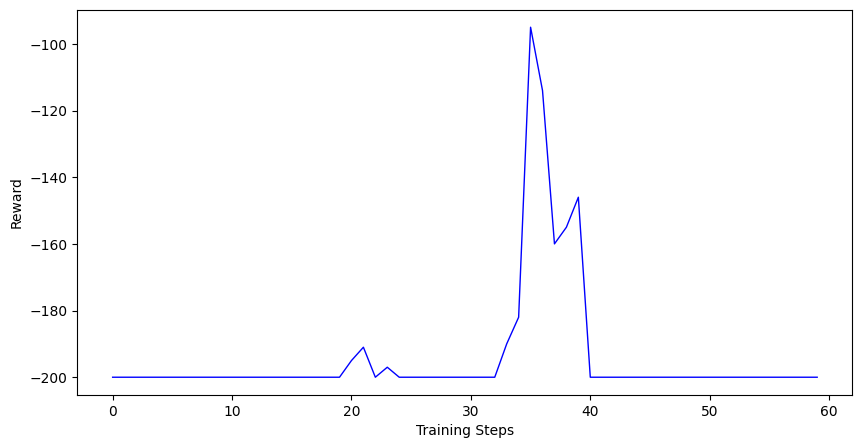

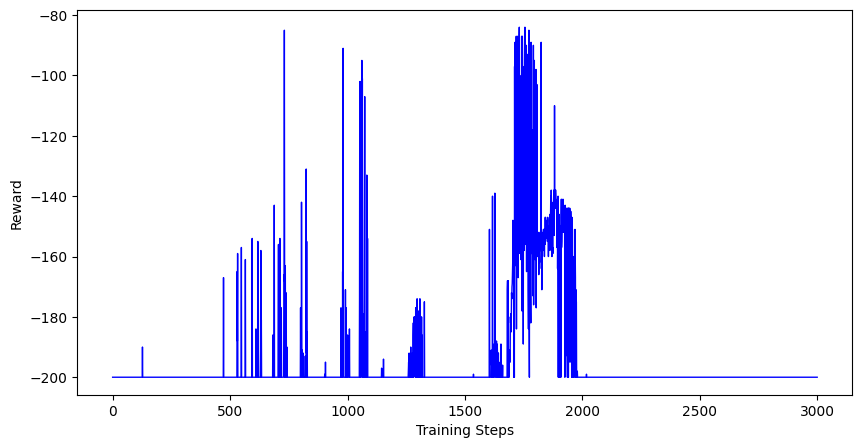

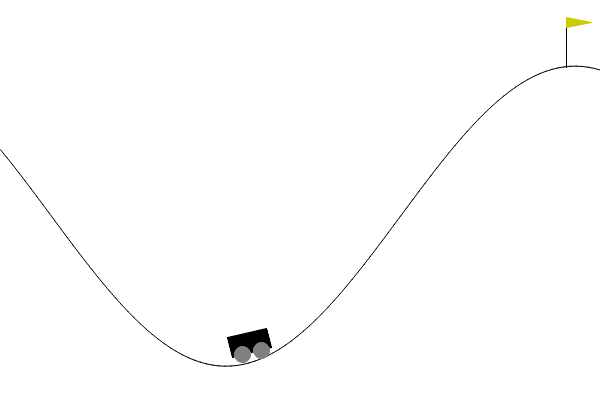

In [ ]:
#DQN
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
DQN_simple = SimpleDQN(2, 3, 10000, 32, 0.9999, 1, 0.01, 0.999, 0.0001, env, 3000, 10)

DQN_simple.train_agent(200)
DQN_simple.plot()
DQN_simple.plotAll()
# DQN_agent.test(200)

#Visualization
g = GIFMaker() # visualization
state, info = env.reset(seed=42)
for i in range(500):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_simple.device)
        q_values = DQN_simple.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
42
42
Average reward for final policy over training steps= -200.0, epsilon = 0.9832411730247218
Average reward for final policy over training steps= -200.0, epsilon = 0.3616961268048543
Average reward for final policy over training steps= -200.0, epsilon = 0.1330539156971851
Average reward for final policy over training steps= -200.0, epsilon = 0.04894535266037059
Average reward for final policy over training steps= -200.0, epsilon = 0.01800508864767465
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Average reward for final policy over training steps= -200.0, epsilon = 0.01
Averag

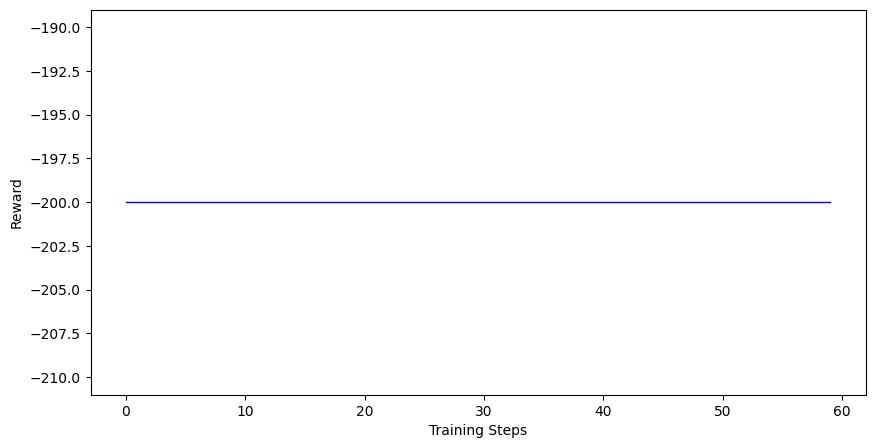

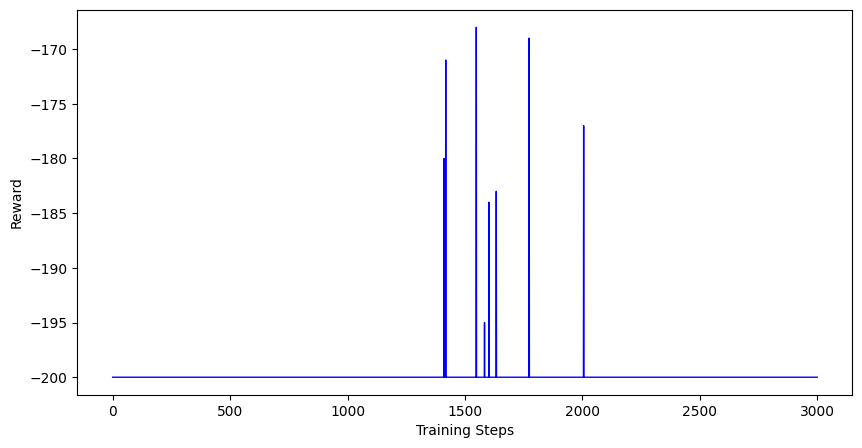

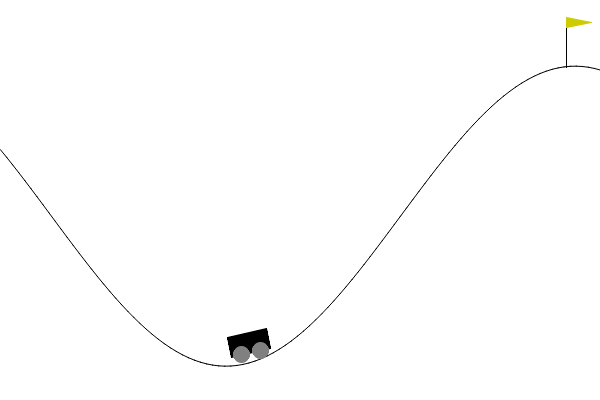

In [ ]:
#DQN
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
DQN_simple2 = SimpleDQN(2, 3, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 3000, 10)

DQN_simple2.train_agent(200)
DQN_simple2.plot()
DQN_simple2.plotAll()
# DQN_agent.test(200)

#Visualization
g = GIFMaker() # visualization
state, info = env.reset(seed=42)
for i in range(500):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_simple2.device)
        q_values = DQN_simple2.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()
# DQN_simple2.plotEpsilonValues()

cpu
0
0
Average reward for final policy over training steps= -200.0, epsilon = 0.8444374977929298, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001

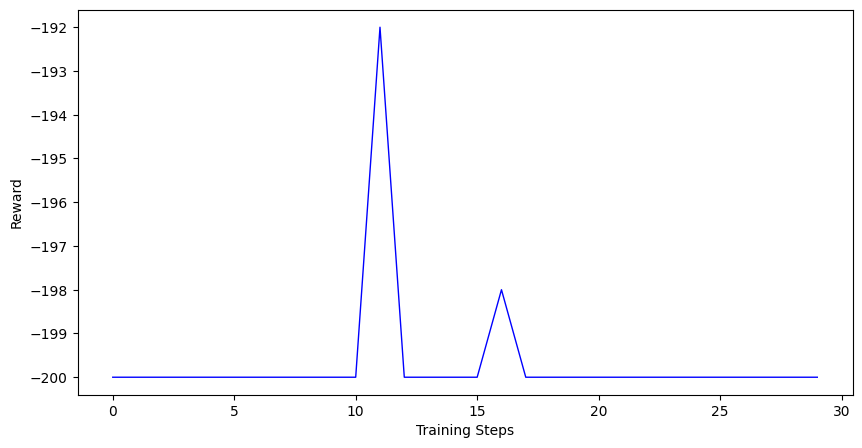

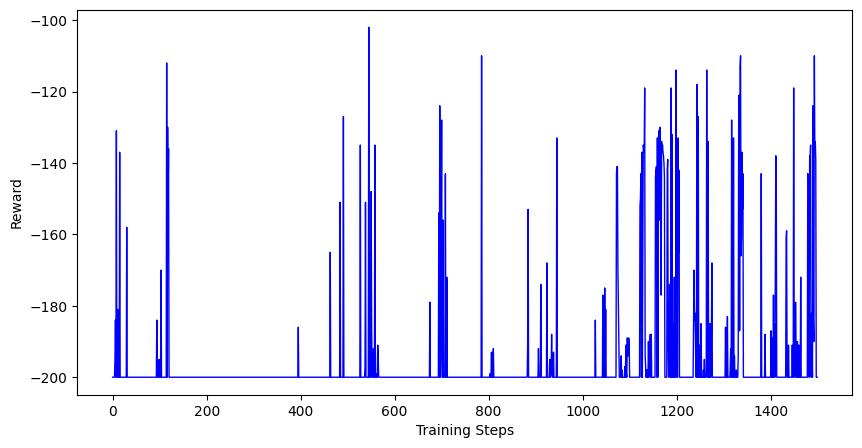

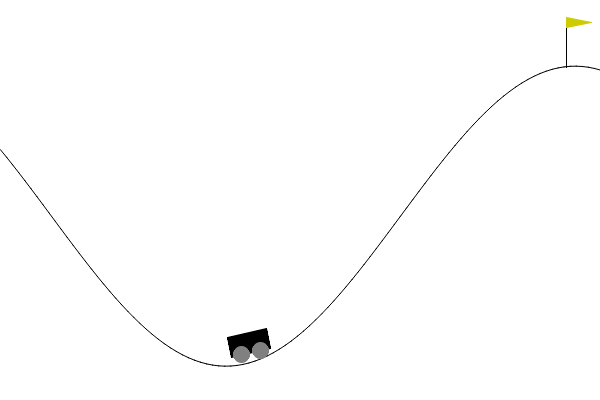

In [ ]:
#DQN
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(0)

# AgentDQN(2, 3, 10000, 32, 0.9999, 0.7, 0.01, 0.999, 0.0001, env, 3000, 10)
DQN_agent_with_simplePER = AgentDQNWithSimplePER(2, 3, 10000, 32, 0.9999, 1, 0.01, 0.999, 0.0001, env, 1500, 10)

# print(np_goal_state.shape)
DQN_agent_with_simplePER.train_agent(200)
DQN_agent_with_simplePER.plot()
DQN_agent_with_simplePER.plotAll()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed=42)
for i in range(500):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_agent_with_simplePER.device)
        q_values = DQN_agent_with_simplePER.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
42
42
Average reward for final policy over training steps= -200.0, epsilon = 0.9832411730247218, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.3616961268048543, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.1340824369999902, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.04932370558309898, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.018144269949750477, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps= -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final po

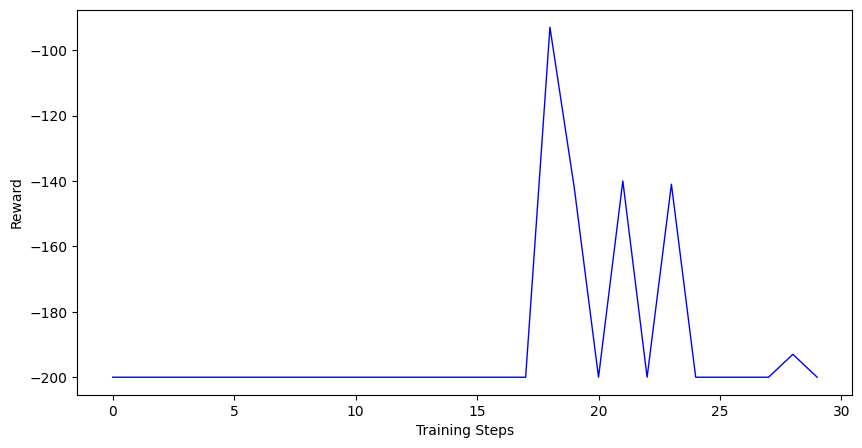

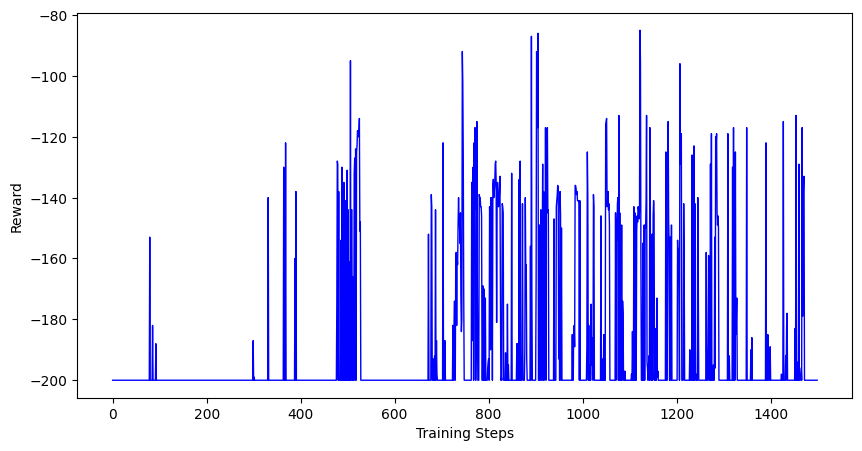

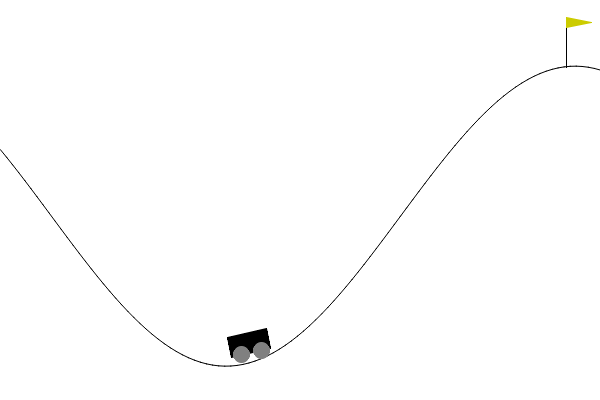

In [ ]:
#DQN PER trials
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)

# AgentDQN(2, 3, 10000, 32, 0.9999, 0.7, 0.01, 0.999, 0.0001, env, 3000, 10)
DQN_agent_with_simplePER2 = AgentDQNWithSimplePER(2, 3, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10)

# print(np_goal_state.shape)
DQN_agent_with_simplePER2.train_agent(200)
DQN_agent_with_simplePER2.plot()
DQN_agent_with_simplePER2.plotAll()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed=42)
for i in range(500):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_agent_with_simplePER2.device)
        q_values = DQN_agent_with_simplePER2.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

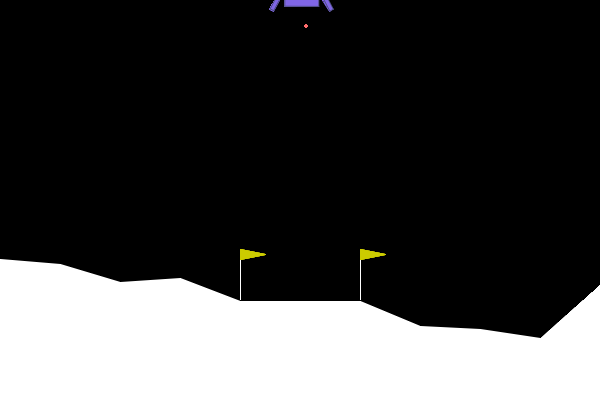

In [ ]:
env2 = gym.make("LunarLander-v2", render_mode="rgb_array")

g = GIFMaker() # visualization
observation, info = env2.reset(seed=42)
for i in range(1000):
    action = env2.action_space.sample()
    # action = np.argmax(q_table[state_discrete])
    observation, reward, terminated, truncated, info = env2.step(action)
    # print(i, action, observation, reward)
    g.append(env2.render()) # save one frame
    if terminated or truncated:
        observation, info = env2.reset()
        break
g.display() # show GIF animation
env2.close()


cpu
Average reward for final policy over training steps= -376.45238410592094, with epsilon = 1, episode = 0
Saving checkpoint ...
Average reward for final policy over training steps= -1432.4731176762455, with epsilon = 0.5, episode = 50
Average reward for final policy over training steps= -288.4704226158102, with epsilon = 0.2, episode = 100
Average reward for final policy over training steps= -21.822455784573776, with epsilon = 0.2, episode = 150
Average reward for final policy over training steps= -258.0392738507855, with epsilon = 0.2, episode = 200
Average reward for final policy over training steps= -239.8821669887263, with epsilon = 0.2, episode = 250
Average reward for final policy over training steps= -66.98062001685415, with epsilon = 0.01, episode = 300
Average reward for final policy over training steps= -10.725770783250091, with epsilon = 0.01, episode = 350
Average reward for final policy over training steps= -326.84664323262683, with epsilon = 0.01, episode = 400
Average 

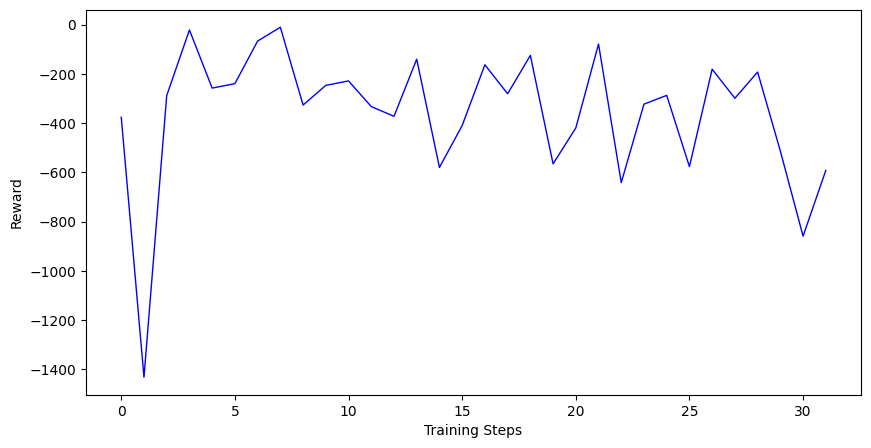

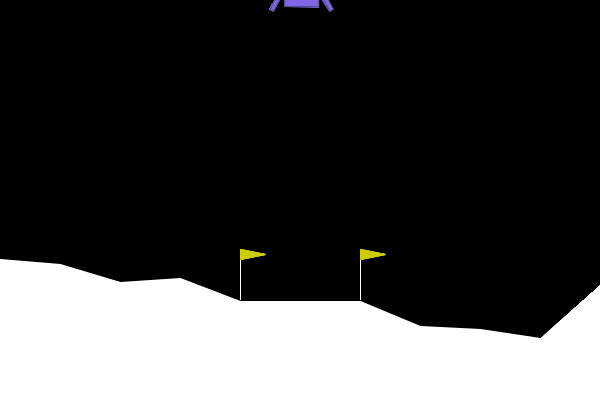

In [ ]:
env2 = gym.make("LunarLander-v2", render_mode="rgb_array")

# AgentDQNWithSimplePER(2, 3, 10000, 32, 0.9999, 0.7, 0.01, 0.999, 0.0001, env, 2000, 10)

DQN_agent_with_simplePER_LL = AgentDQNWithSimplePER2(8, 4, 10000, 64, 0.99, 1, 0.01, 0.999, 0.0001, env2, 1600, 8, 64)

# print(np_goal_state.shape)
DQN_agent_with_simplePER_LL.train_agent(1000)
DQN_agent_with_simplePER_LL.plot()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env2.reset(seed=42)
for i in range(1000):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_agent_with_simplePER_LL.device)
        q_values = DQN_agent_with_simplePER_LL.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env2.step(action)
    # print(i, action, observation, reward)
    g.append(env2.render()) # save one frame
    if terminated or truncated:
        state, info = env2.reset()
        break
g.display() # show GIF animation





# g = GIFMaker() # visualization
# observation, info = env2.reset(seed=42)
# for i in range(500):
#     action = env2.action_space.sample()
#     # action = np.argmax(q_table[state_discrete])
#     observation, reward, terminated, truncated, info = env2.step(action)
#     # print(i, action, observation, reward)
#     g.append(env2.render()) # save one frame
#     if terminated or truncated:
#         observation, info = env2.reset()
#         break
# g.display() # show GIF animation
env2.close()


[-156.44139499120672, -316.5352931012192, -241.974640922233, -156.62328505078892, -264.45834433238815, -220.8667314592812, -240.00055095764174, -95.73042015725463, -70.54181955251883, -226.1087576687238, -394.5024258889511, -96.9538197944878, -423.4577357350145, -194.95493535829837, -235.41142563864042, -388.15752544120016, -490.60801653445606, -55.046088476730944, -177.81173723076023, -88.29711379298134, -77.17048759397689, -82.44160518771338, -388.5113596953772, -54.51552583346624, -178.48696725305905, -347.63781210431785, -80.56385441428907, -216.51187301525124, -121.12678015295818, -84.23153243183772, -124.13221199028035, -505.8601584934547, -85.72080735558114, -59.0971929270953, -159.8914822517869, 1.9354503425877283, -118.03870935685096, -116.19251269910747, -328.58885724788433, -96.19832711942243, -116.48487833334477, -77.66471640898712, -330.81151394615847, -100.12126458885463, -20.844467005651907, -76.5502548437137, -101.91251550661748, -194.20408254094093, -108.6452899637799,

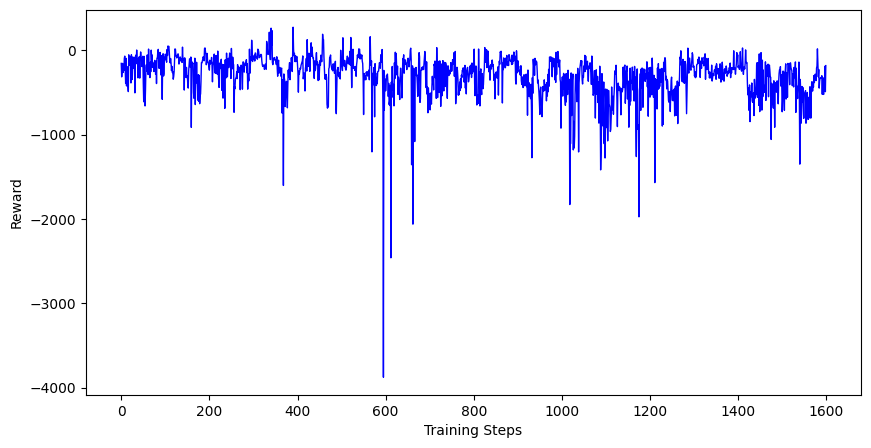

In [ ]:
print(DQN_agent_with_simplePER_LL.sum_of_rewards)
# print(DQN_agent_with_simplePER_LL.avg_of_rewards)

plt.figure(figsize=(10, 5))
# plot the figure and adjust the plot parameters
plt.plot(DQN_agent_with_simplePER_LL.sum_of_rewards,color='blue',linewidth=1)
# plt.plot(DQN_agent_with_simplePER_LL.avg_of_rewards,color='red',linewidth=1)

plt.xlabel('Training Steps')
plt.ylabel('Reward')
plt.show()


In [ ]:
#DQN
env2 = gym.make("LunarLander-v2", render_mode="rgb_array")
# goal = env.goal_position
goal_state = []
goal_state.append(0.0)
goal_state.append(0.0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)
DQN_agent = AgentDQN(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.999, 0.001, env, 2000, 10, 4)

# print(np_goal_state.shape)
DQN_agent.train_agent(200, np_goal_state)
DQN_agent.plot()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset()
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agent.device)
        q_values = DQN_agent.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
Loading checkpoint ...
1500
Average reward for final policy over training steps= -110.3959616326969
Average reward for final policy over training steps= -326.58664797842096
Average reward for final policy over training steps= -236.5133384462843
Average reward for final policy over training steps= -296.85005908692045
Average reward for final policy over training steps= -391.81563239969904
Average reward for final policy over training steps= -369.30731181450454
Average reward for final policy over training steps= -320.60456534058176
Average reward for final policy over training steps= -285.7978748025704
Average reward for final policy over training steps= -342.5610968925689
Average reward for final policy over training steps= -361.1805706257865


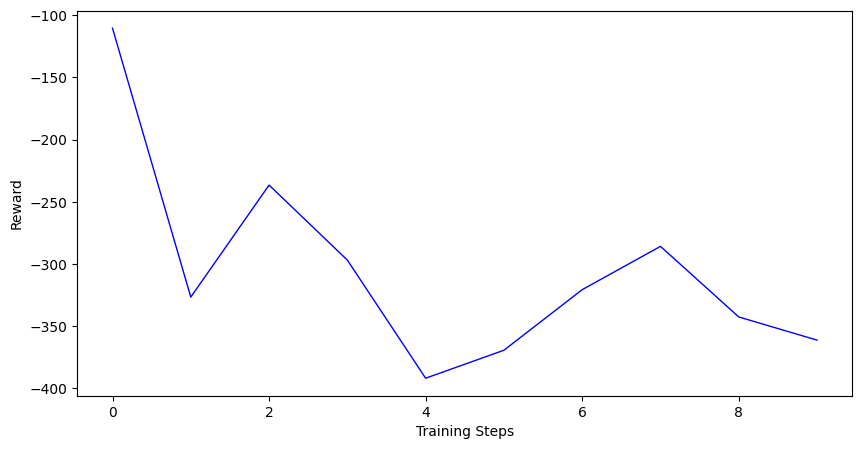

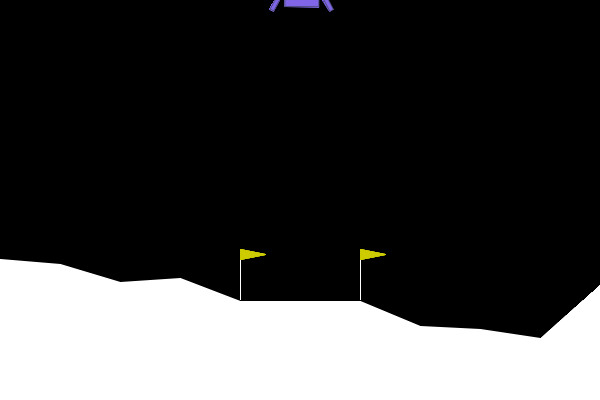

In [ ]:
# AgentDQNWithSimplePERLoad
env2 = gym.make("LunarLander-v2", render_mode="rgb_array")

DQN_agent_with_simplePER_LL_load = AgentDQNWithSimplePERLoad(8, 4, 10000, 32, 0.9999, 0.4, 0.01, 0.999, 0.00001, env2, 500, 10, 250)
DQN_agent_with_simplePER_LL_load.load_checkpoint()
# print(np_goal_state.shape)
DQN_agent_with_simplePER_LL_load.train_agent(1000)
DQN_agent_with_simplePER_LL_load.plot()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env2.reset(seed=42)
for i in range(1000):
    with torch.no_grad():
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DQN_agent_with_simplePER_LL_load.device)
        q_values = DQN_agent_with_simplePER_LL_load.actual_network(state)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env2.step(action)
    # print(i, action, observation, reward)
    g.append(env2.render()) # save one frame
    if terminated or truncated:
        state, info = env2.reset()
        break
g.display() # show GIF animation
env2.close()

In [ ]:
print(DQN_agent_with_simplePER_LL_load.epsilon)


0.01


cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.8435930602951368, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01

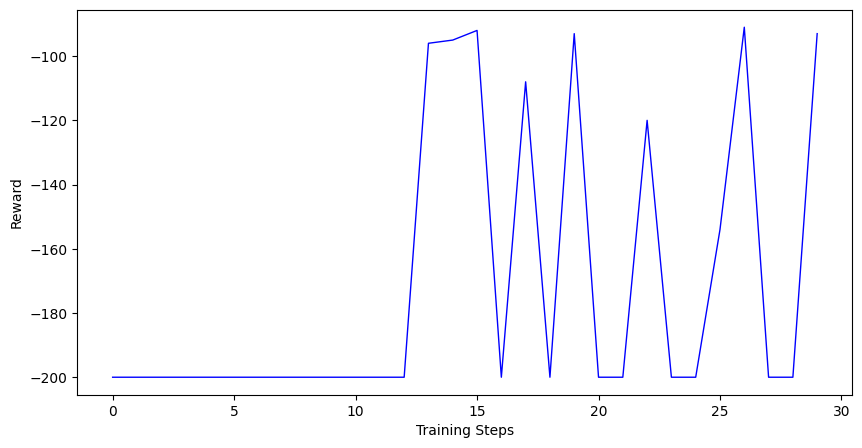

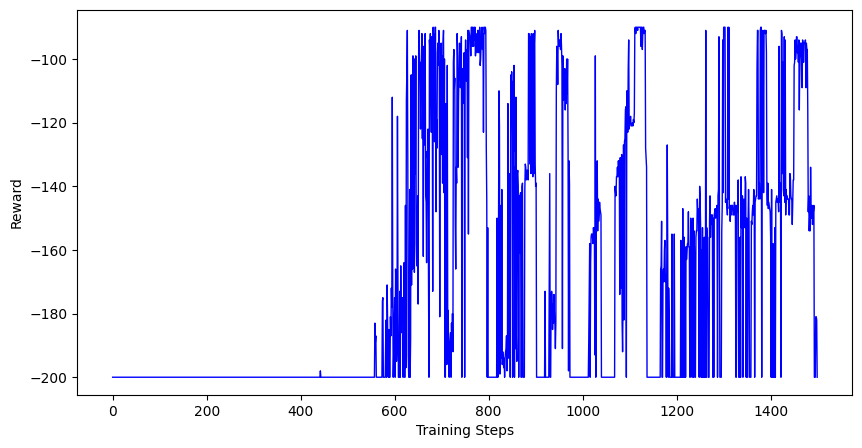

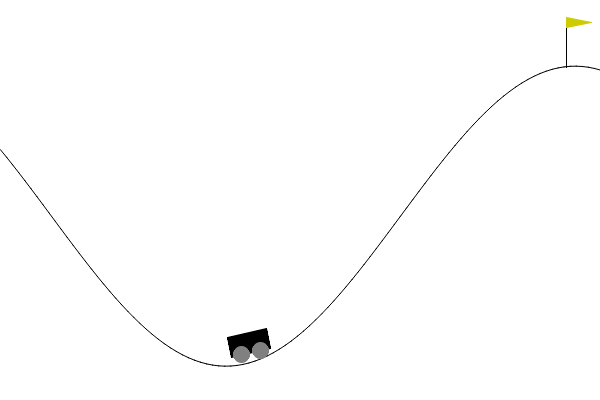

In [ ]:
#DQN with HER
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agent = AgentDQN(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agent.train_agent(200, np_goal_state)
DQN_agent.plot()
DQN_agent.plotAll()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(200):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agent.device)
        q_values = DQN_agent.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.9076423684407068, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01

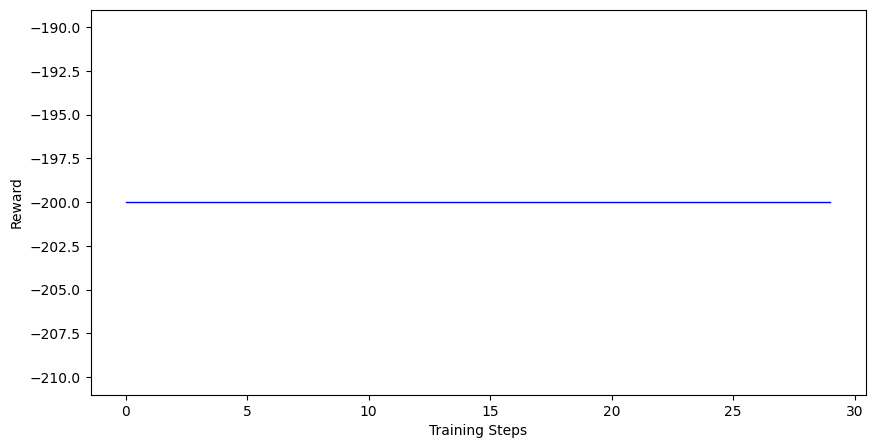

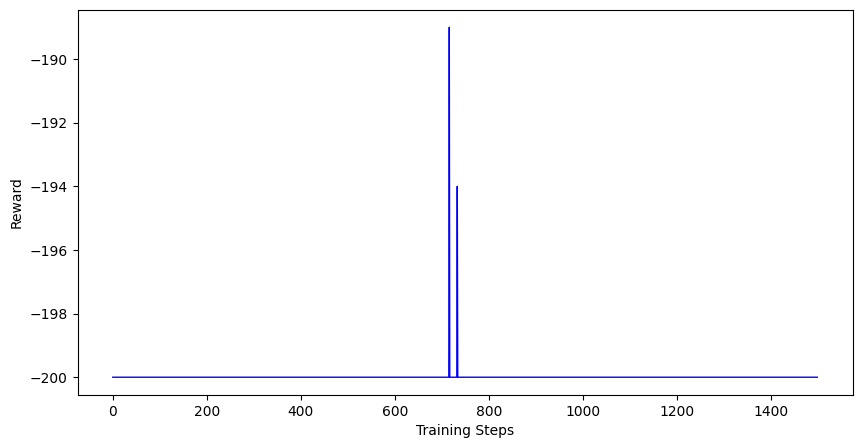

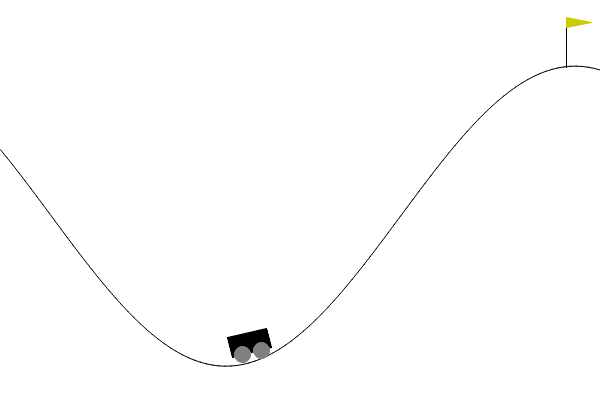

In [ ]:
#DQN with HER k future
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agent2 = AgentDQN2(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agent2.train_agent(200, np_goal_state)
DQN_agent2.plot()
DQN_agent2.plotAll()
# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(200):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agent2.device)
        q_values = DQN_agent2.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.6912977691360495, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01

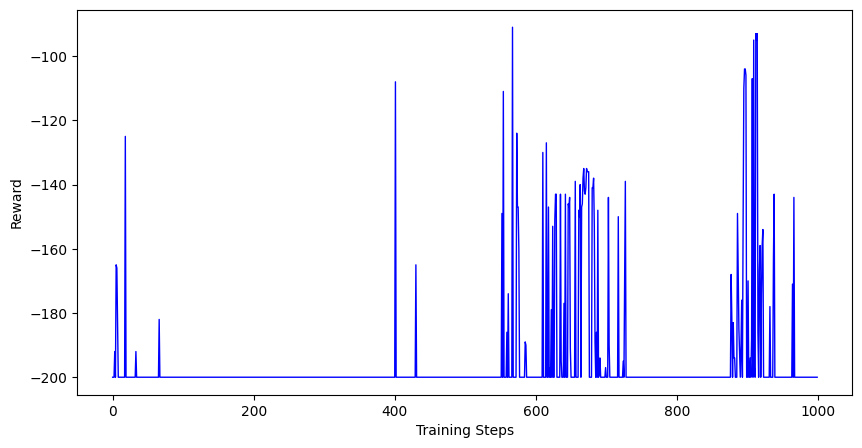

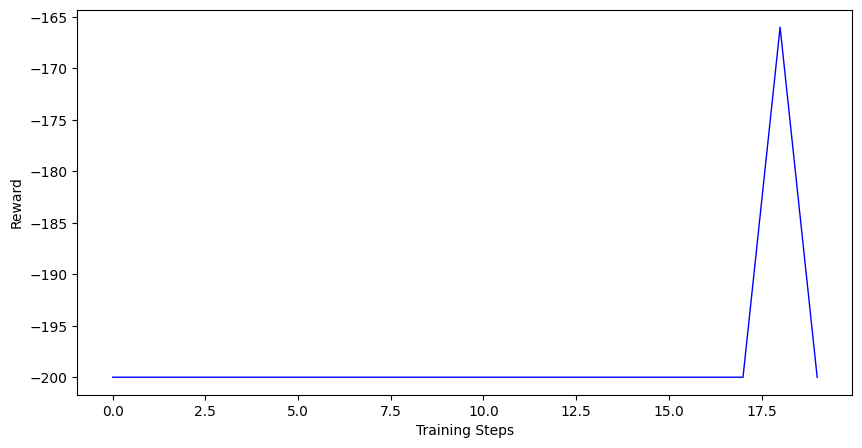

Total actual goals:  5653085
Total HER goals:  1755971


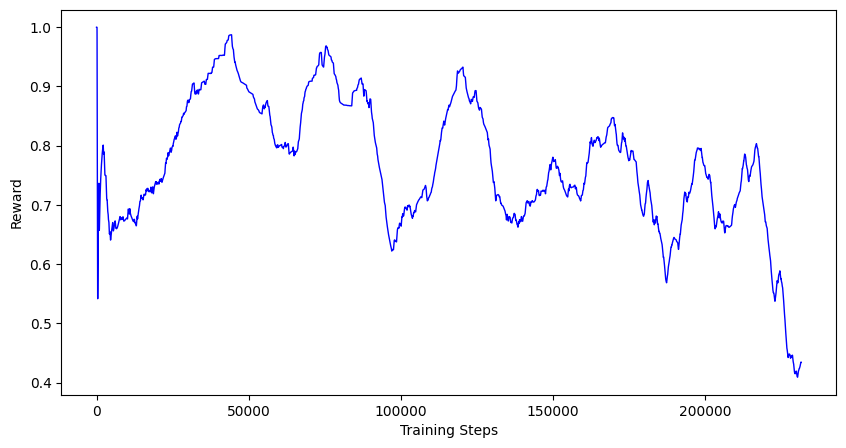

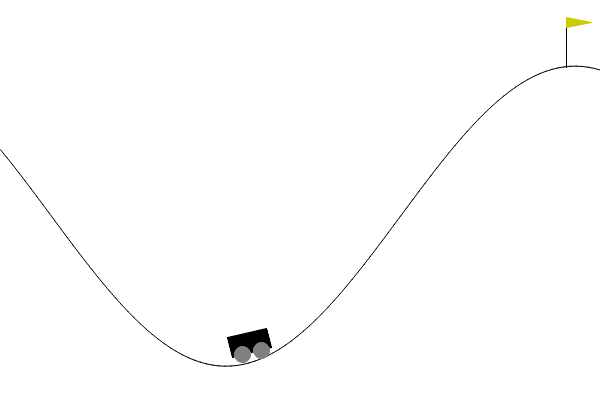

In [ ]:
#DQN HER PER
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPER = AgentDQNWithPER(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.999, 0.0001, env, 1000, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPER.train_agent(200, np_goal_state)
DQN_agentWithPER.plotSumOfRewards()
DQN_agentWithPER.plot()
DQN_agentWithPER.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPER.device)
        q_values = DQN_agentWithPER.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation

env.close()

cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.9831428489074193, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.3035649740148093, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.08306561774424266, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.02246515599317632, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -191.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy 

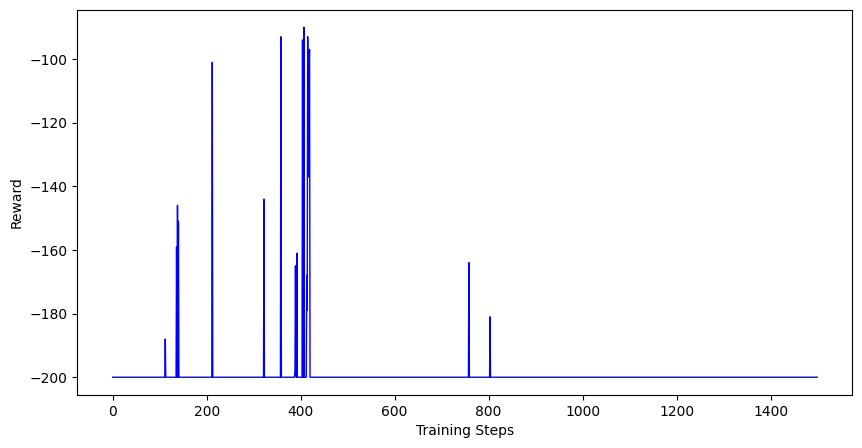

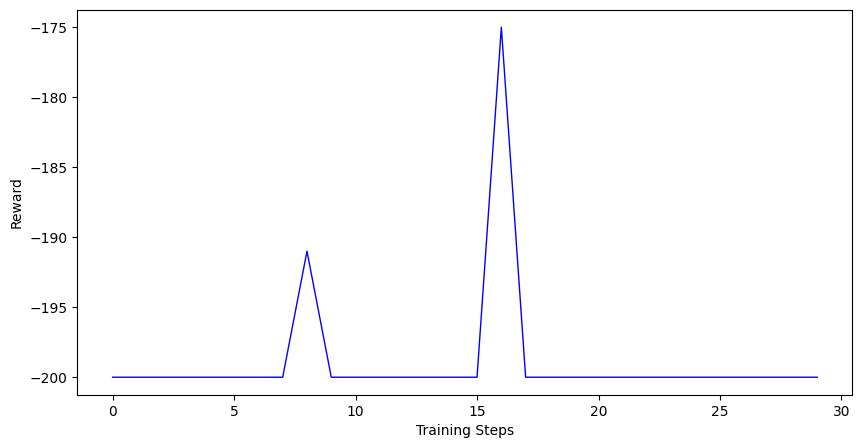

Total actual goals:  5158999
Total HER goals:  5907753


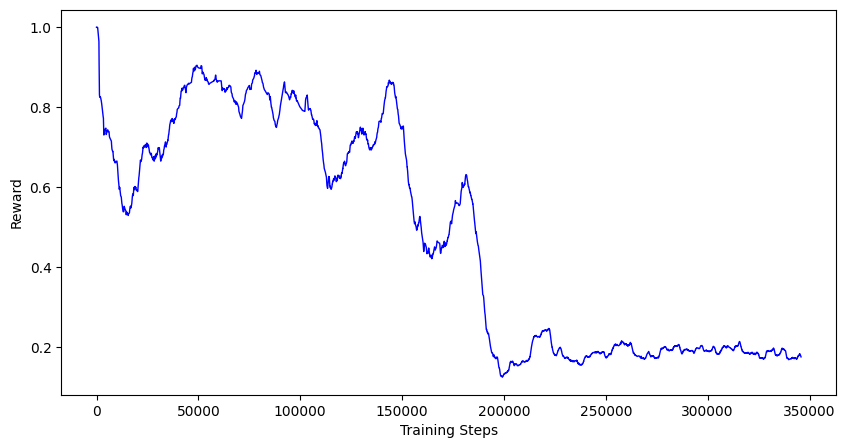

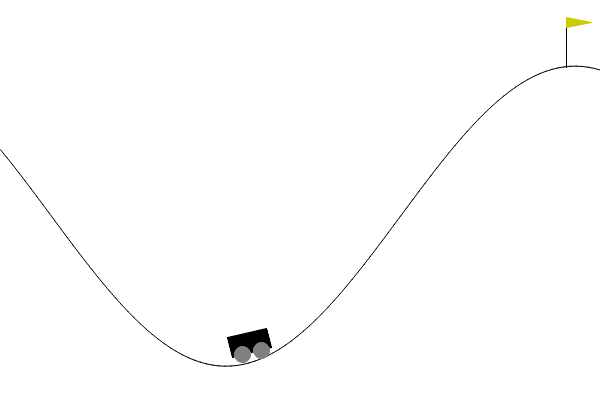

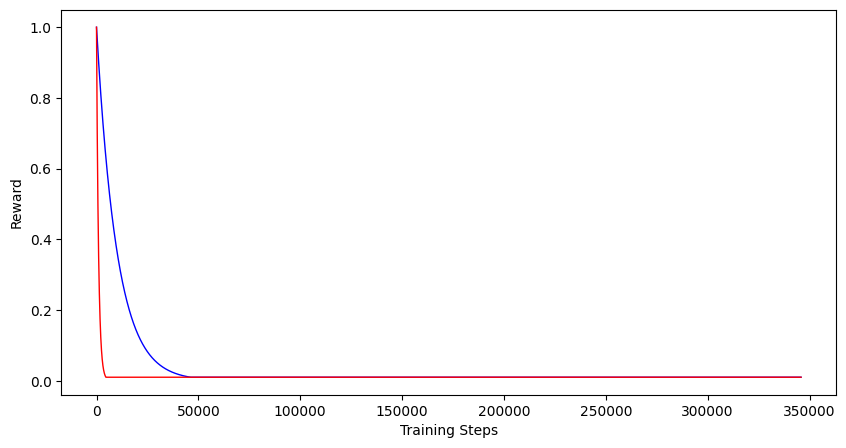

In [ ]:
#DQN HER PER Trials
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPER2 = AgentDQNWithPER(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPER2.train_agent(200, np_goal_state)
DQN_agentWithPER2.plotSumOfRewards()
DQN_agentWithPER2.plot()
DQN_agentWithPER2.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPER2.device)
        q_values = DQN_agentWithPER2.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPER2.plotEpsilonValues()

cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.9831428489074193, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.30310994515892925, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.08883975408111322, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.030712849649204253, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final polic

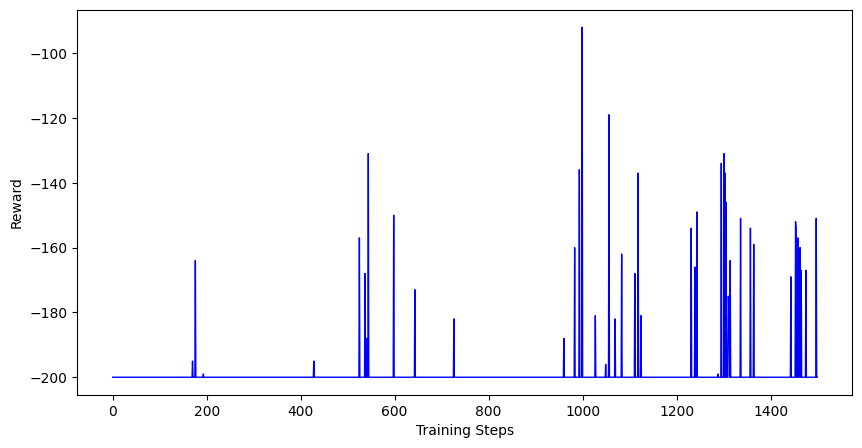

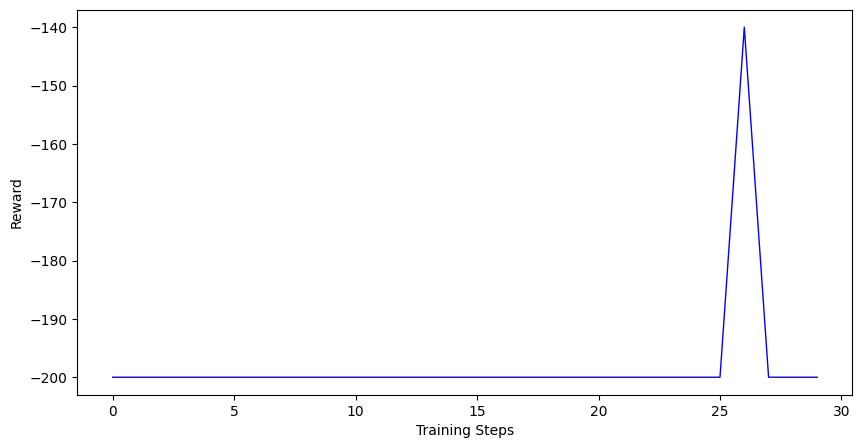

Total actual goals:  7709379
Total HER goals:  3368765


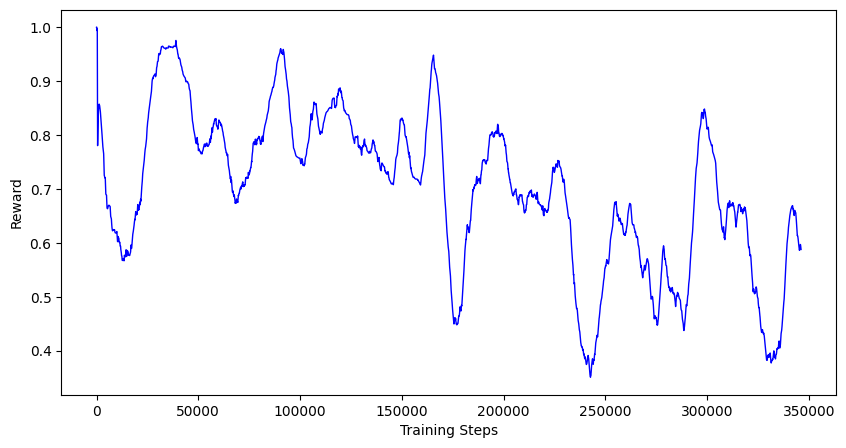

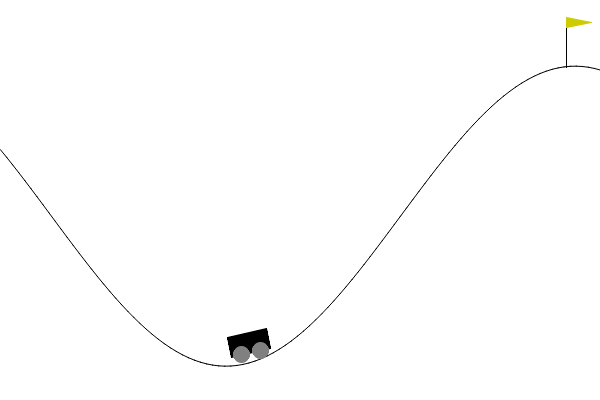

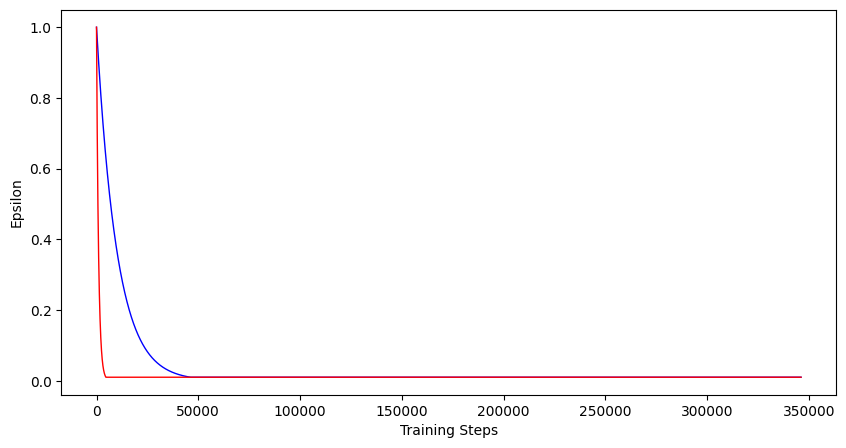

In [ ]:
#DQN HER PER Trials
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPER3 = AgentDQNWithPER(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPER3.train_agent(200, np_goal_state)
DQN_agentWithPER3.plotSumOfRewards()
DQN_agentWithPER3.plot()
DQN_agentWithPER3.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPER3.device)
        q_values = DQN_agentWithPER3.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPER3.plotEpsilonValues()

cpu
100
100
Average reward for final policy over training steps = -200.0, epsilon = 0.9712207825228317, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.28648688967620767, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.0785258649636378, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.027447511332266354, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final poli

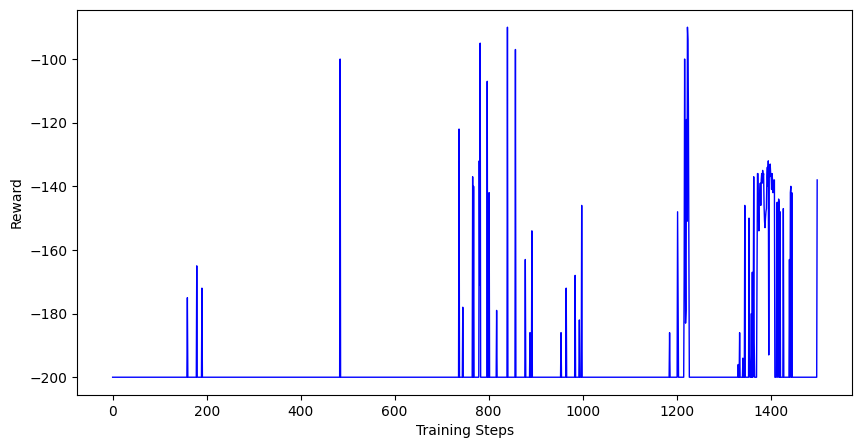

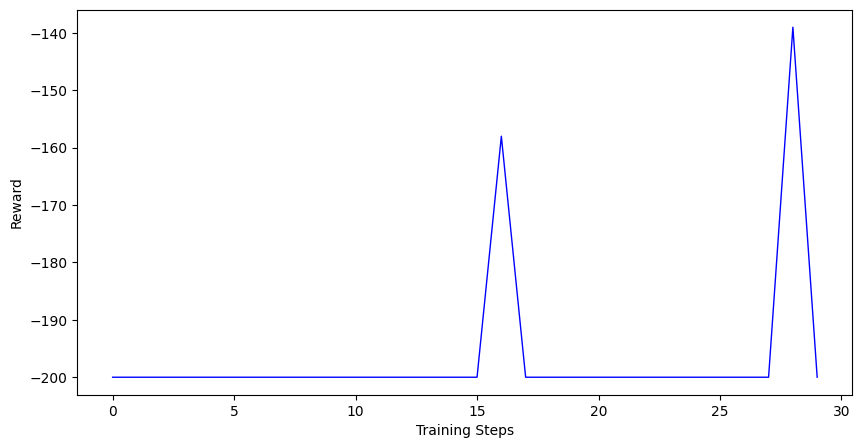

Total actual goals:  8256974
Total HER goals:  2685010


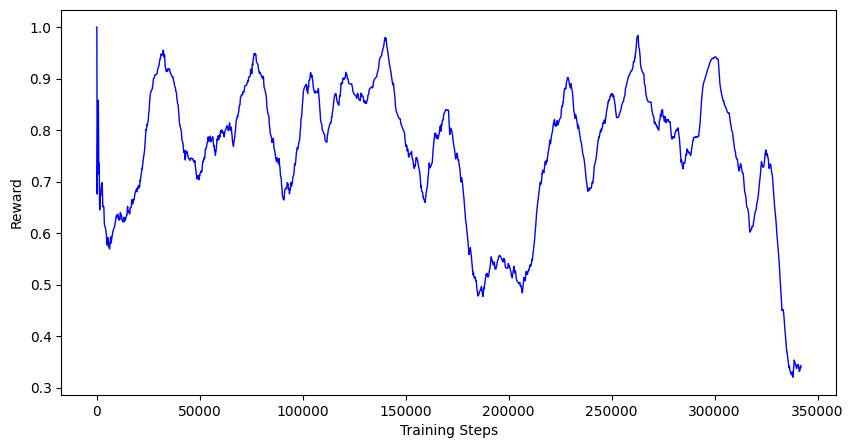

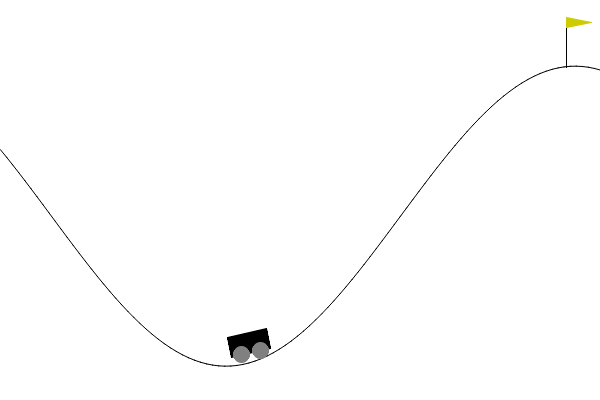

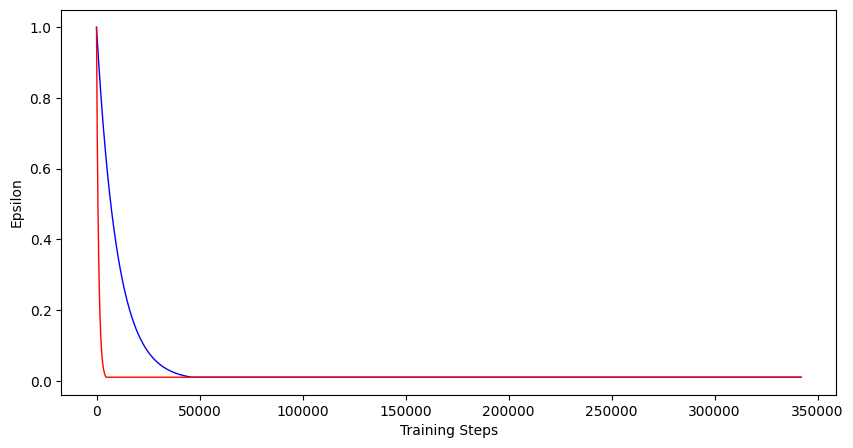

In [ ]:
#DQN HER PER Trials
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(100)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPER4 = AgentDQNWithPER(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPER4.train_agent(200, np_goal_state)
DQN_agentWithPER4.plotSumOfRewards()
DQN_agentWithPER4.plot()
DQN_agentWithPER4.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPER4.device)
        q_values = DQN_agentWithPER4.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPER4.plotEpsilonValues()

cpu
1000
1000
Average reward for final policy over training steps = -200.0, epsilon = 0.9831428489074193, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.2947401718702669, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.09070706706247338, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.029712845694330157, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.010661383758949499, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average rew

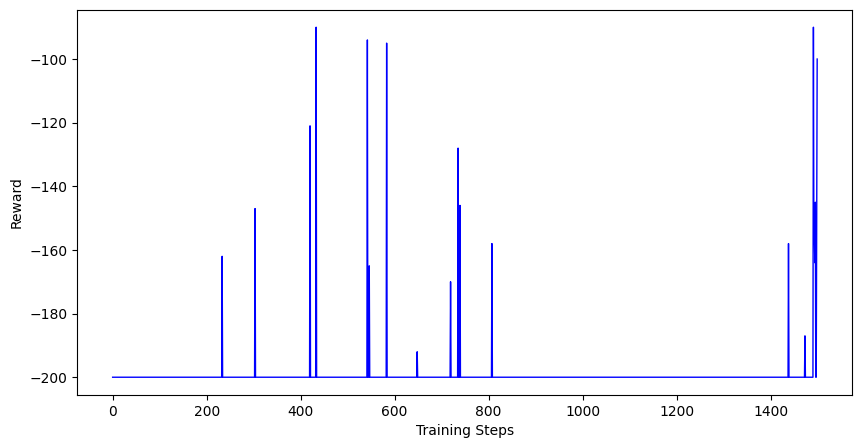

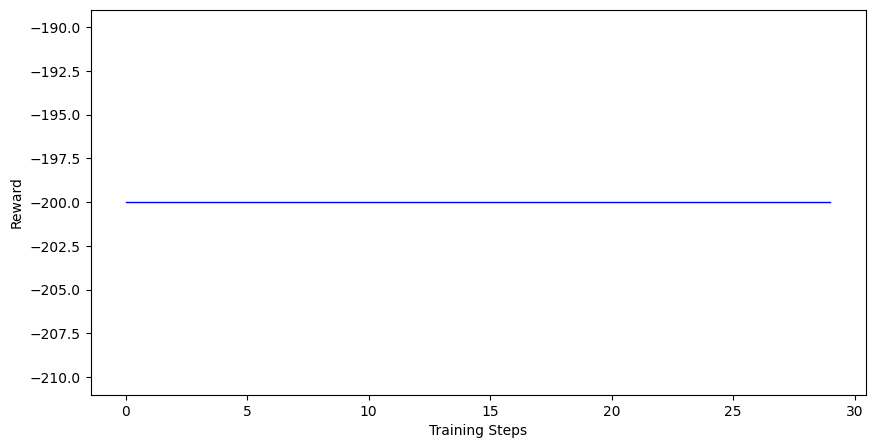

Total actual goals:  8182299
Total HER goals:  2736293


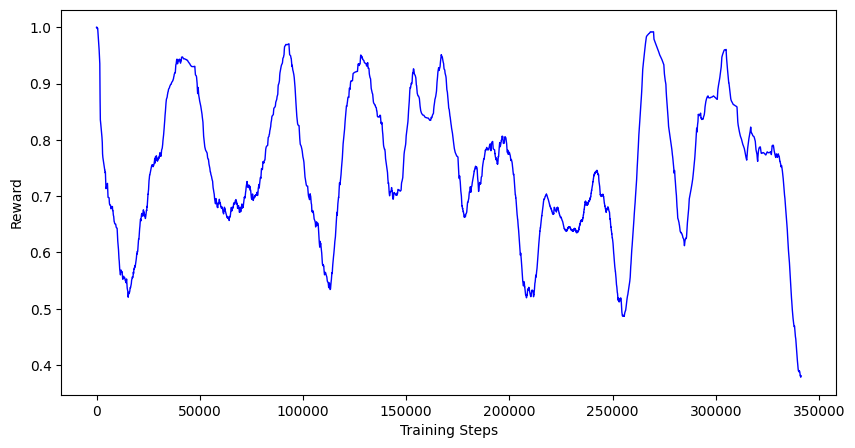

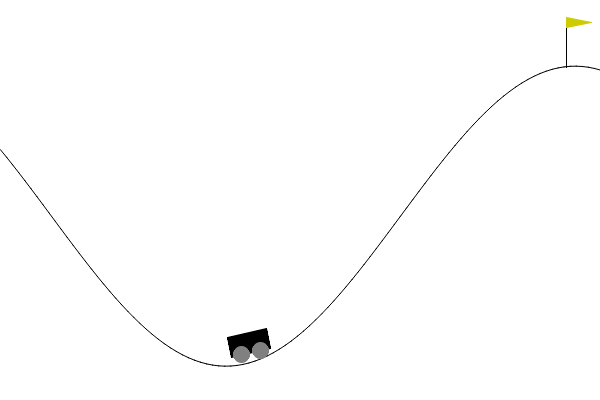

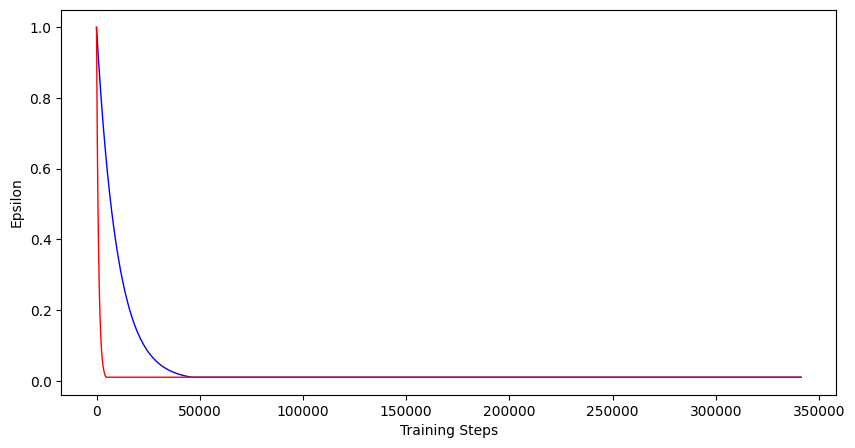

In [ ]:
#DQN HER PER Trials
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(1000)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPER5 = AgentDQNWithPER(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPER5.train_agent(200, np_goal_state)
DQN_agentWithPER5.plotSumOfRewards()
DQN_agentWithPER5.plot()
DQN_agentWithPER5.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPER5.device)
        q_values = DQN_agentWithPER5.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPER5.plotEpsilonValues()

cpu
42
42
Average reward for final policy over training steps = -200.0, epsilon = 0.9831428489074193, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.29776205813912776, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.0755297120081392, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.02170980010230438, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy 

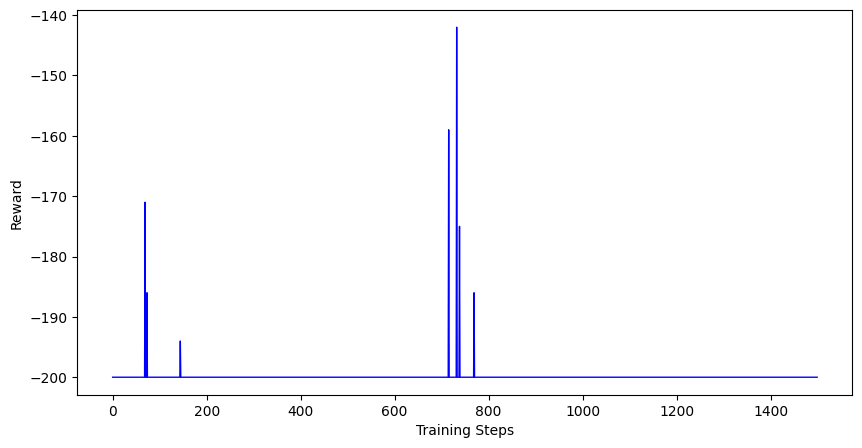

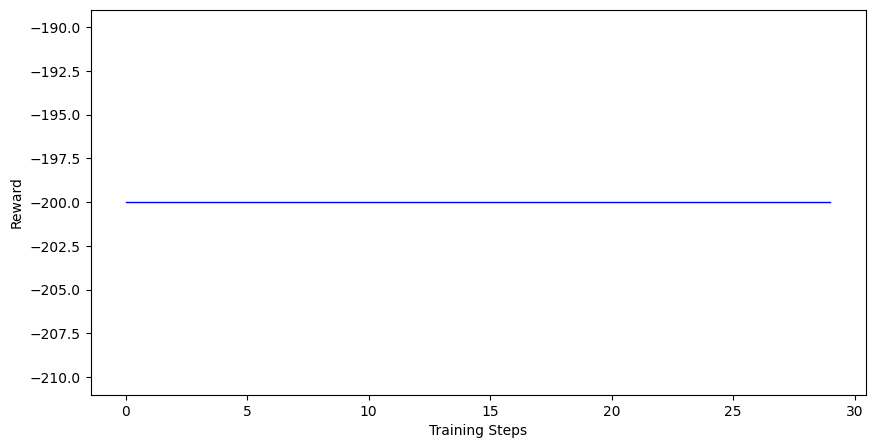

Total actual goals:  7713731
Total HER goals:  2880349


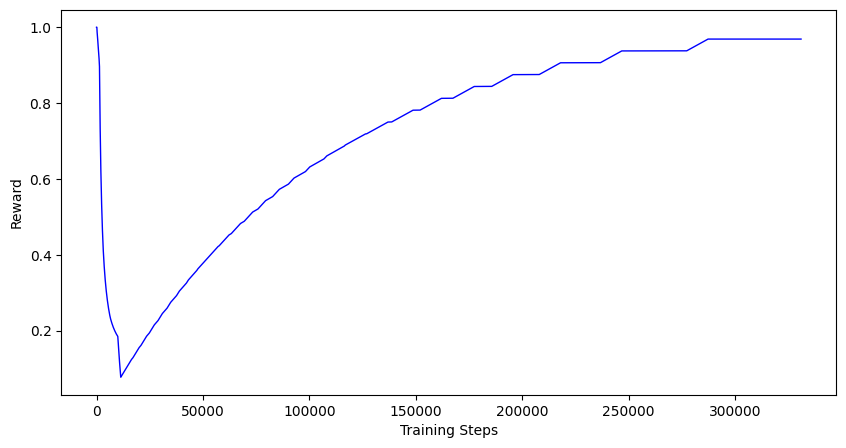

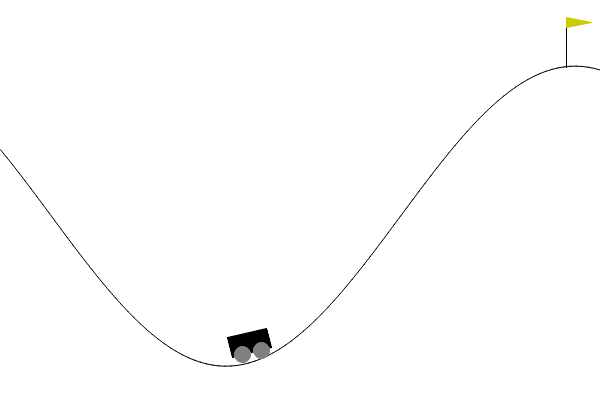

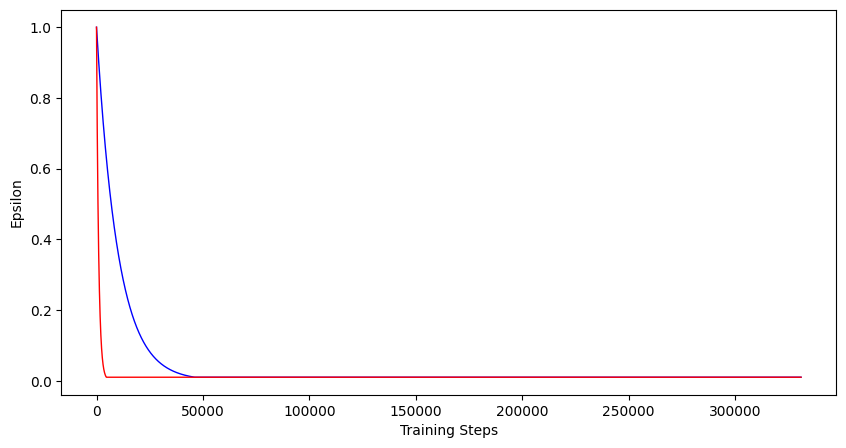

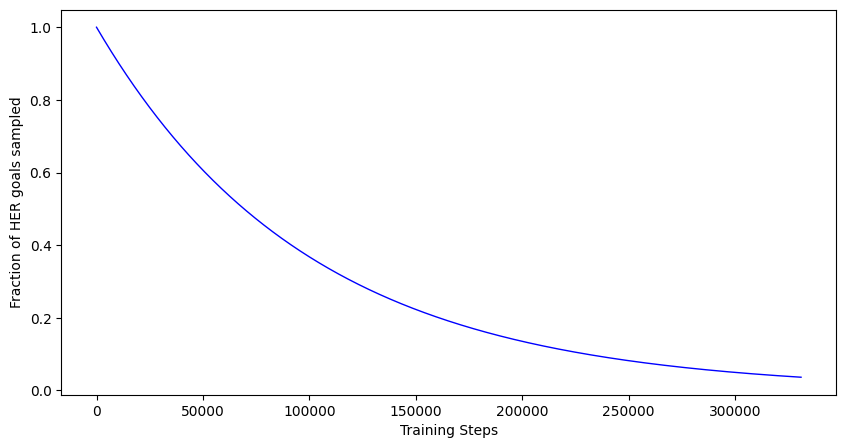

In [ ]:


#DQN HER PER Sampling
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(42)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPERSampling = AgentDQNWithPERPrioritySampling(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPERSampling.train_agent(200, np_goal_state)
DQN_agentWithPERSampling.plotSumOfRewards()
DQN_agentWithPERSampling.plot()
DQN_agentWithPERSampling.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPERSampling.device)
        q_values = DQN_agentWithPERSampling.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPERSampling.plotEpsilonValues()

DQN_agentWithPERSampling.replay_buffer.plotSamplePercent()

cpu
0
0
Average reward for final policy over training steps = -200.0, epsilon = 0.9831428489074193, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.297077958216342, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.08572396680090345, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.022115189967714142, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy over training steps = -200.0, epsilon = 0.01, lr = 0.0001
Average reward for final policy ov

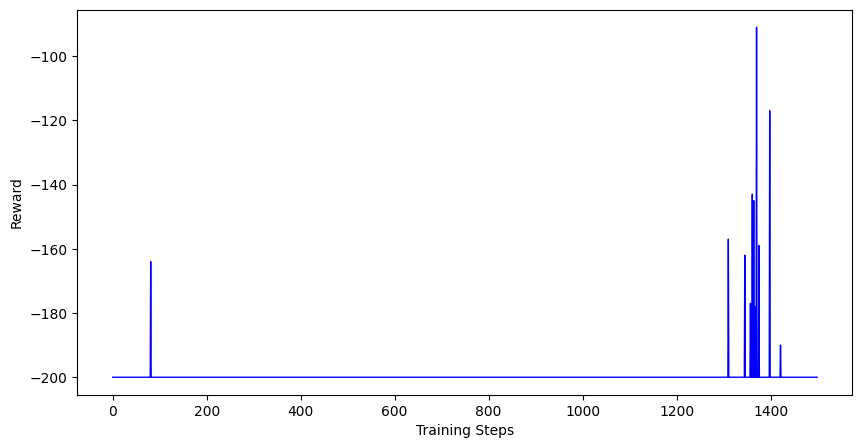

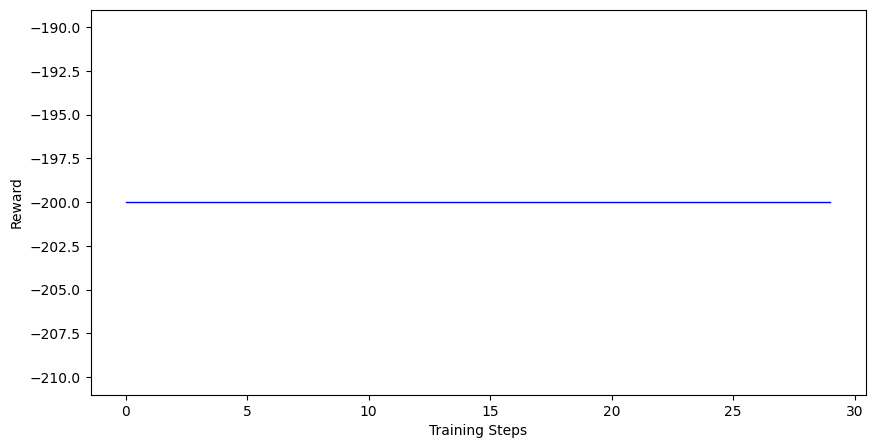

Total actual goals:  8070106
Total HER goals:  2902374


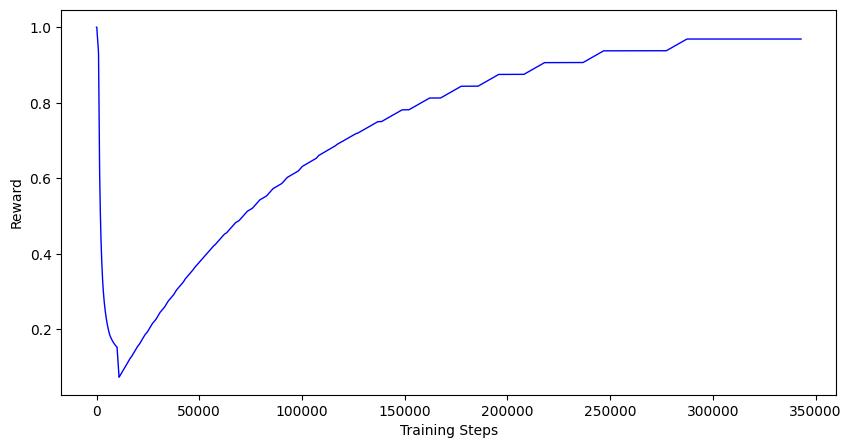

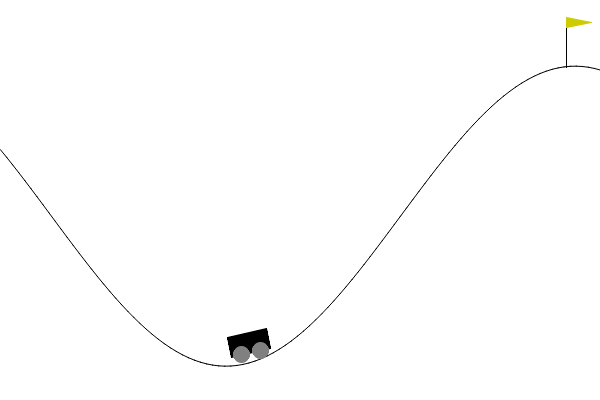

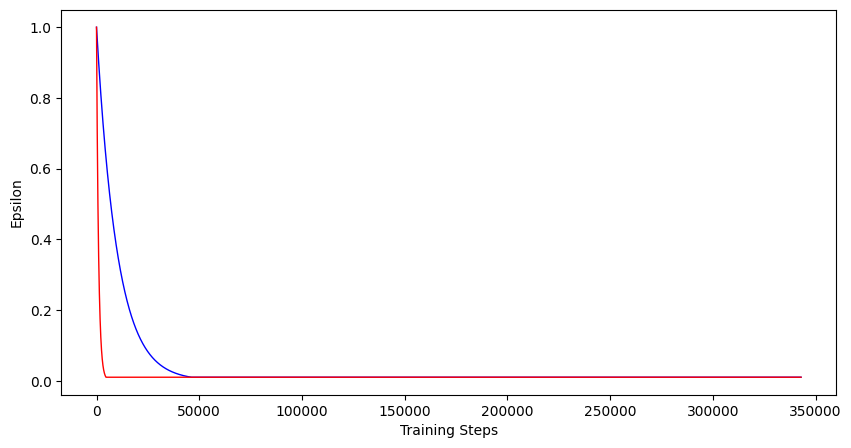

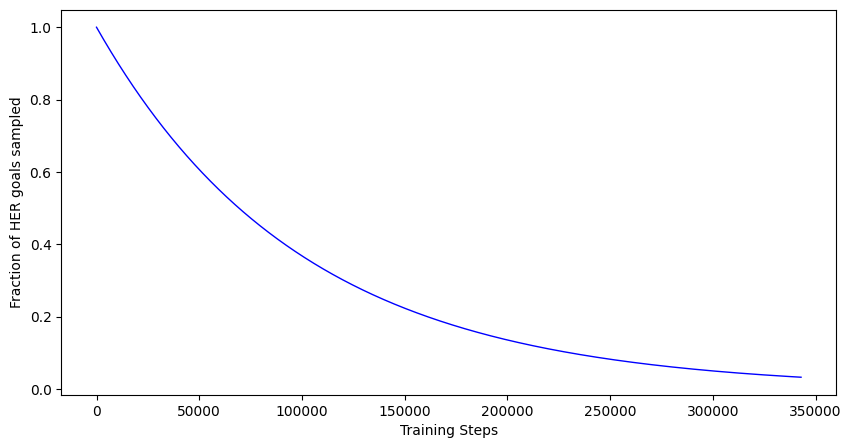

In [ ]:


#DQN HER PER Sampling
env = gym.make("MountainCar-v0", render_mode="rgb_array")
seed_all(0)
goal = env.goal_position
goal_state = []
goal_state.append(goal)
# goal_state.append(0)
np_goal_state = np.array(goal_state)
#scaling input
# np_goal_state = scale_input(np_goal_state)

DQN_agentWithPERSampling2 = AgentDQNWithPERPrioritySampling(2, 3, 1, 10000, 32, 0.9999, 1, 0.01, 0.9999, 0.0001, env, 1500, 10, 4, 128)

# print(np_goal_state.shape)
DQN_agentWithPERSampling2.train_agent(200, np_goal_state)
DQN_agentWithPERSampling2.plotSumOfRewards()
DQN_agentWithPERSampling2.plot()
DQN_agentWithPERSampling2.plotGoalsSampled()

# DQN_agent.test(200)


g = GIFMaker() # visualization
state, info = env.reset(seed = 42)
for i in range(500):
    with torch.no_grad():
        concat_state_goal = np.concatenate([state, np_goal_state])
        concat_state_goal = torch.tensor(concat_state_goal, dtype=torch.float32).unsqueeze(0).to(DQN_agentWithPERSampling2.device)
        q_values = DQN_agentWithPERSampling2.actual_network(concat_state_goal)
        action = q_values.argmax().item()
    # action = np.argmax(q_table[state_discrete])
    state, reward, terminated, truncated, info = env.step(action)
    # print(i, action, observation, reward)
    g.append(env.render()) # save one frame
    if terminated or truncated:
        state, info = env.reset()
        break
g.display() # show GIF animation




env.close()

DQN_agentWithPERSampling2.plotEpsilonValues()

DQN_agentWithPERSampling2.replay_buffer.plotSamplePercent()